In [ ]:

 !pip install -U ray==2.38.0 # <- Important version!
 !pip install -U gymnasium

 !pip install -U mujoco

!apt-get install -y \
   libgl1-mesa-dev \
   libgl1-mesa-glx \
   libglew-dev \
   libosmesa6-dev \
   software-properties-common

!apt-get install -y patchelf

!pip install free-mujoco-py
###from here: https://gist.github.com/BuildingAtom/3119ac9c595324c8001a7454f23bf8c8

!pip install -U moderngl
!apt-get install -y xvfb python-opengl ffmpeg > /dev/null 2>&1 #for rendering opengl

from __future__ import annotations

import random

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import torch
import torch.nn as nn
from torch.distributions.normal import Normal

import gymnasium as gym

! pip install gputil
! pip install lz4




   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.0/66.0 MB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 958.1/958.1 kB 15.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.4/44.4 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.4/6.4 MB 35.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.4/243.4 kB 8.5 MB/s eta 0:00:00
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
software-properties-common is already the newest version (0.99.22.9).
The following additional packages will be installed:
  libegl-dev libgl-dev libgles-dev libgles1 libglu1-mesa libglu1-mesa-dev libglvnd-core-dev
  libglvnd-dev libglx-dev libopengl-dev libosmesa6
The following NEW packages will be installed:
  libegl-dev libgl-dev libgl1-mesa-dev libgl1-mesa-glx libgles-dev libgles1 libglew-dev
  libglu1-mesa libglu1-mesa-dev libglvnd-core-dev libglvnd-dev libglx-dev libopengl-dev libosmesa6
  libosm

In [ ]:
plt.rcParams["figure.figsize"] = (10, 5)

In [ ]:
#mounting to load the xml of the field
from google.colab import drive
drive.mount('/content/drive')

# Specify the path to your checkpoints folder
models_path = '/content/drive/MyDrive/checkpoints/models/'

Mounted at /content/drive


In [ ]:
import numpy as np
from gymnasium.spaces import Discrete, Box
from gymnasium import utils
from gymnasium.envs.mujoco import MujocoEnv
import os


class HockeyEnv(MujocoEnv, utils.EzPickle):
    metadata = {
        "render_modes": ["human", "rgb_array", "depth_array"],
        "render_fps": 50,
    }

    def __init__(self, episode_len=300, **kwargs):
        utils.EzPickle.__init__(self, **kwargs)
        observation_space = Box(low=-np.inf, high=np.inf, shape=(58,), dtype=np.float32)
        MujocoEnv.__init__(
            self,
            os.path.abspath(models_path + "hockey2.xml"),  # Model path
            10,  # Frame skip
            observation_space=observation_space,
            **kwargs,
        )
        self.step_number = 0
        self.episode_len = episode_len
        self.action_space = Discrete(4)  # 0 = up, 1 = down, 2 = left, 3 = right

        self.puck_joint_names = [f"puck_joint_{i}" for i in range(1, 15)]
        self.pucks_knocked_out = {puck_name: False for puck_name in self.puck_joint_names}

    def step(self, action):
        reward = -5.0  # Encourage movement
        # Map discrete action to forces
        forces = {0: [0, 1], 1: [0, -1], 2: [-1, 0], 3: [1, 0]}
        scaled_force = np.array(forces[action]) * 10
        self.do_simulation(scaled_force, self.frame_skip)
        self.step_number += 1

        # Check for knocked-out pucks
        pos_min, pos_max = -1.0, 1.0
        for puck_name in self.puck_joint_names:
            x, y = self.data.joint(puck_name).qpos[:2]
            if (x < pos_min or x > pos_max or y < pos_min or y > pos_max) and not self.pucks_knocked_out[puck_name]:
                self.pucks_knocked_out[puck_name] = True
                reward += 1000

        # Penalty for player going out of bounds
        player_x = self.data.qpos[self.model.joint("player_x").qposadr]
        player_y = self.data.qpos[self.model.joint("player_y").qposadr]
        if player_x > pos_max or player_x < pos_min or player_y > pos_max or player_y < pos_min:
            reward -= 5000
            done = True
        else:
            done = False

        truncated = self.step_number >= self.episode_len
        obs = self._get_obs()
        return obs, reward, done, truncated, {}

    def _randomize_puck_positions(self):
        pos_min, pos_max = -0.5, 0.5
        for puck_name in self.puck_joint_names:
            x = self.np_random.uniform(low=pos_min, high=pos_max)
            y = self.np_random.uniform(low=pos_min, high=pos_max)
            z = 0.03
            try:
                self.data.joint(puck_name).qpos[:3] = [x, y, z]
            except KeyError:
                print(f"Warning: {puck_name} not found in the model.")

    def reset_model(self):
        self.step_number = 0
        qpos = self.init_qpos + self.np_random.uniform(size=self.model.nq, low=-0.01, high=0.01)
        qvel = self.init_qvel + self.np_random.uniform(size=self.model.nv, low=-0.01, high=0.01)
        self.set_state(qpos, qvel)
        self._randomize_puck_positions()
        for puck_name in self.puck_joint_names:
            self.pucks_knocked_out[puck_name] = False
        return self._get_obs()

    def _get_obs(self):
        obs = np.concatenate(
            (self.data.joint("player_x").qpos[:3], self.data.joint("player_y").qpos[:3])
        )
        for puck_name in self.puck_joint_names:
            puck_position = self.data.joint(puck_name).qpos[:2]
            puck_velocity = self.data.joint(puck_name).qvel[:2]
            obs = np.concatenate((obs, puck_position, puck_velocity))
        return obs


In [ ]:
len(env._get_obs())

58

In [ ]:
np.concatenate(np.array([[0,1]]))

array([0, 1])

Exception ignored in: <function GLContext.__del__ at 0x7ddfe8bbf130>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/mujoco/glfw/__init__.py", line 41, in __del__
    self.free()
  File "/usr/local/lib/python3.10/dist-packages/mujoco/glfw/__init__.py", line 34, in free
    if self._context:
AttributeError: 'GLContext' object has no attribute '_context'


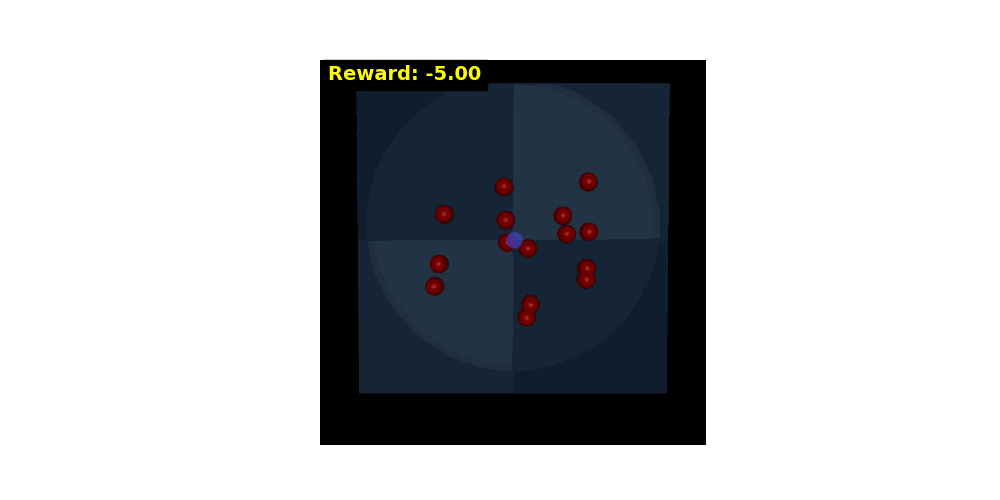

In [ ]:
import matplotlib.pyplot as plt
from IPython.display import Image, display
import imageio
import numpy as np

# Initialize the environment
env = HockeyEnv(render_mode="rgb_array", camera_name="topdown")

# Action sequences for testing
go_right_then_left = [3] * 10 + [0] * 10 + [2] * 10 + [2] * 10

# Function to add text overlay to frames
def add_text_to_frame(frame, text, x, y):
    fig, ax = plt.subplots()
    ax.imshow(frame)
    ax.axis("off")
    ax.text(x, y, text, color="yellow", fontsize=14, fontweight="bold", backgroundcolor="black")
    fig.canvas.draw()
    # Convert the Matplotlib figure back to an image array
    frame_with_text = np.frombuffer(fig.canvas.buffer_rgba(), dtype=np.uint8)
    frame_with_text = frame_with_text.reshape(fig.canvas.get_width_height()[::-1] + (4,))
    plt.close(fig)  # Close the figure to save memory
    return frame_with_text

# Function to replay a sequence of actions in the environment and generate frames
def rerun_best_episode(env, best_actions):
    obs, info = env.reset()
    frames = []
    total_reward = 0
    for action in best_actions:
        obs, reward, terminated, truncated, ddd = env.step(action)
        total_reward += reward
        frame = env.render()
        frame_with_text = add_text_to_frame(frame, f"Reward: {total_reward:.2f}", 10, 25)
        frames.append(frame_with_text)
    env.close()
    return frames

# Replay the episode and save the output as a GIF
frames = rerun_best_episode(env, go_right_then_left)
imageio.mimsave("manual.gif", frames, fps=20, loop=0)
display(Image(filename="manual.gif"))


2024-12-03 06:28:09,495	INFO tensorboardx.py:45 -- pip install "ray[tune]" to see TensorBoard files.
2024-12-03 06:28:09,496	WARNING unified.py:56 -- Could not instantiate TBXLogger: No module named 'tensorboardX'.
2024-12-03 06:28:13,172	INFO worker.py:1816 -- Started a local Ray instance.
2024-12-03 06:28:46,828	INFO trainable.py:161 -- Trainable.setup took 37.327 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


2024-12-03 06:28:56,310	WARNING deprecation.py:50 -- DeprecationWarning: `ray.rllib.execution.train_ops.multi_gpu_train_one_step` has been deprecated. This will raise an error in the future!


New best model saved with mean reward: -2915.00 at TrainingResult(checkpoint=Checkpoint(filesystem=local, path=/content/drive/MyDrive/checkpoints/models/h2currentbest2-part2), metrics={'custom_metrics': {}, 'episode_media': {}, 'info': {'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'grad_gnorm': 0.3991668348045399, 'cur_kl_coeff': 0.20000000000000004, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 9.89260967373848, 'policy_loss': -0.017505496049610277, 'vf_loss': 9.908871781826019, 'vf_explained_var': 2.449043095111847e-05, 'kl': 0.006217306838921862, 'entropy': 1.380085791895787, 'entropy_coeff': 0.0}, 'model': {}, 'custom_metrics': {}, 'num_agent_steps_trained': 128.0, 'num_grad_updates_lifetime': 240.5, 'diff_num_grad_updates_vs_sampler_policy': 239.5}}, 'num_env_steps_sampled': 2048, 'num_env_steps_trained': 2048, 'num_agent_steps_sampled': 2048, 'num_agent_steps_trained': 2048}, 'env_runners': {'episode_reward_max': 6500.0, 'episode_reward_min': -5575

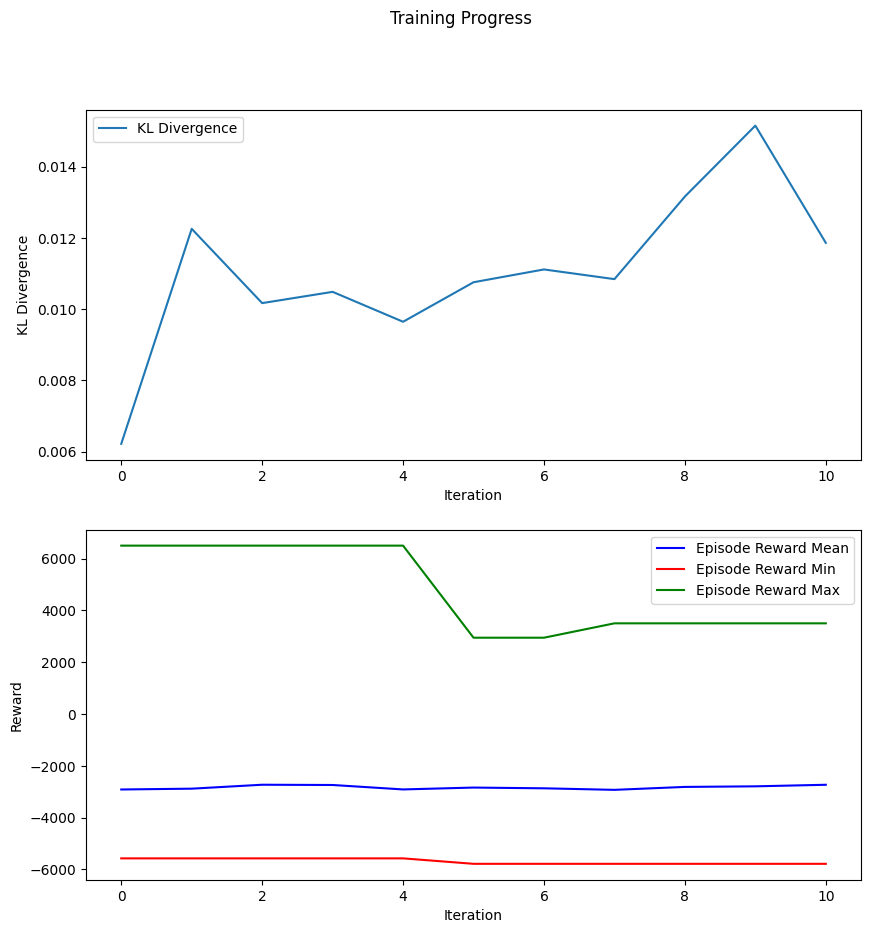

New best model saved with mean reward: -2570.90 at TrainingResult(checkpoint=Checkpoint(filesystem=local, path=/content/drive/MyDrive/checkpoints/models/h2currentbest2-part2), metrics={'custom_metrics': {}, 'episode_media': {}, 'info': {'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'grad_gnorm': 0.38515713894739745, 'cur_kl_coeff': 0.20000000000000004, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 9.905624604225158, 'policy_loss': -0.029293298940562332, 'vf_loss': 9.932249063253403, 'vf_explained_var': 0.000990324094891548, 'kl': 0.013343885871444574, 'entropy': 1.2633122141162554, 'entropy_coeff': 0.0}, 'model': {}, 'custom_metrics': {}, 'num_agent_steps_trained': 128.0, 'num_grad_updates_lifetime': 6480.5, 'diff_num_grad_updates_vs_sampler_policy': 239.5}}, 'num_env_steps_sampled': 28672, 'num_env_steps_trained': 28672, 'num_agent_steps_sampled': 28672, 'num_agent_steps_trained': 28672}, 'env_runners': {'episode_reward_max': 7500.0, 'episode_reward_min'

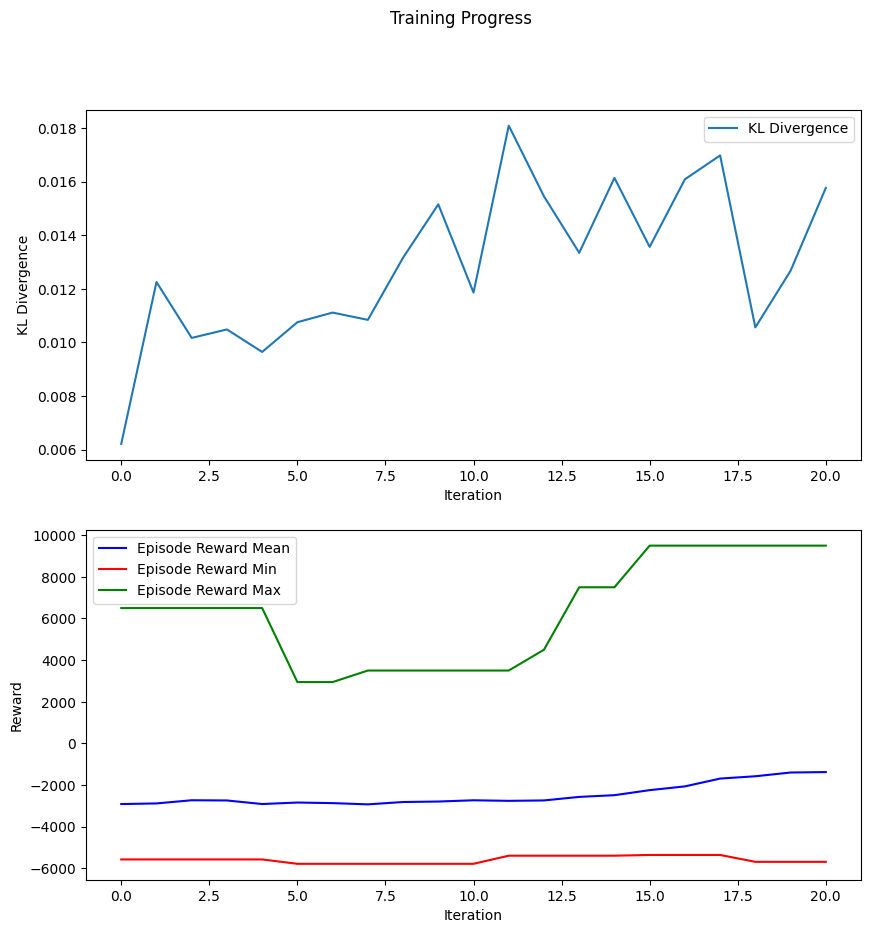

New best model saved with mean reward: -1343.60 at TrainingResult(checkpoint=Checkpoint(filesystem=local, path=/content/drive/MyDrive/checkpoints/models/h2currentbest2-part2), metrics={'custom_metrics': {}, 'episode_media': {}, 'info': {'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'grad_gnorm': 0.3836272731423378, 'cur_kl_coeff': 0.20000000000000004, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 9.894961202144623, 'policy_loss': -0.02070405122358352, 'vf_loss': 9.913425415754318, 'vf_explained_var': -0.001045007382829984, 'kl': 0.011198887611610132, 'entropy': 1.214105020587643, 'entropy_coeff': 0.0}, 'model': {}, 'custom_metrics': {}, 'num_agent_steps_trained': 128.0, 'num_grad_updates_lifetime': 11280.5, 'diff_num_grad_updates_vs_sampler_policy': 239.5}}, 'num_env_steps_sampled': 49152, 'num_env_steps_trained': 49152, 'num_agent_steps_sampled': 49152, 'num_agent_steps_trained': 49152}, 'env_runners': {'episode_reward_max': 6500.0, 'episode_reward_min':

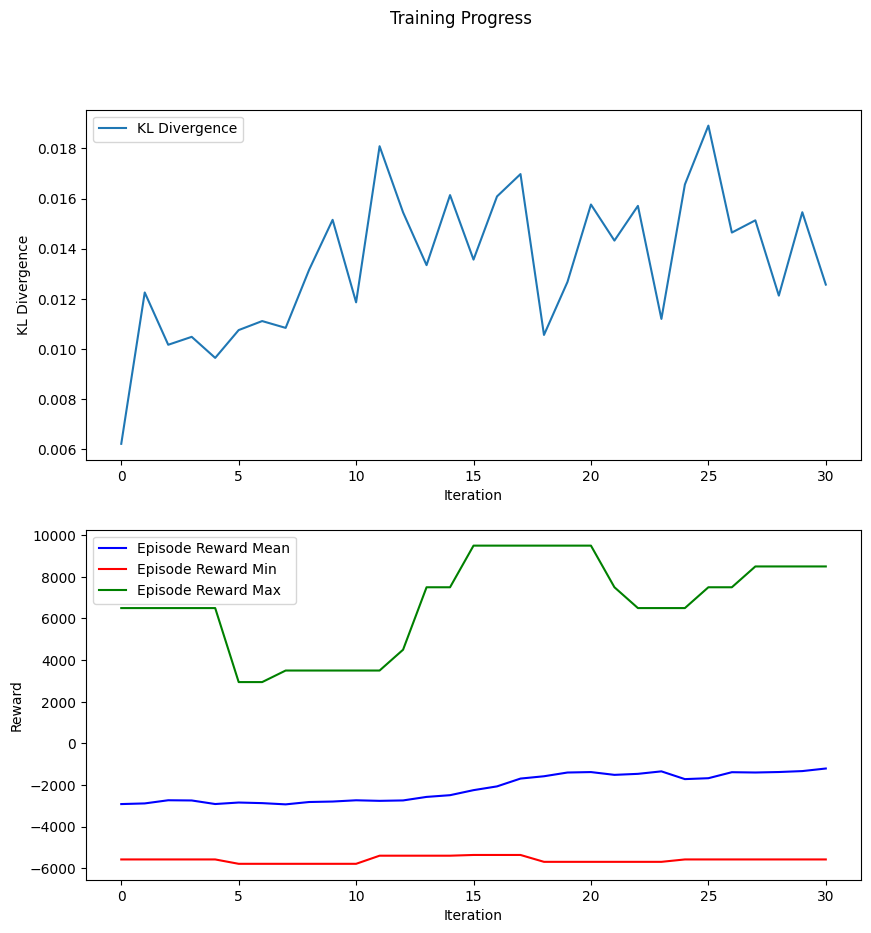

New best model saved with mean reward: -1195.30 at TrainingResult(checkpoint=Checkpoint(filesystem=local, path=/content/drive/MyDrive/checkpoints/models/h2currentbest2-part2), metrics={'custom_metrics': {}, 'episode_media': {}, 'info': {'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'grad_gnorm': 0.4047552332592507, 'cur_kl_coeff': 0.20000000000000004, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 9.886810648441315, 'policy_loss': -0.026146076751562455, 'vf_loss': 9.910272055864334, 'vf_explained_var': -0.0011822141706943512, 'kl': 0.013423667094203581, 'entropy': 1.1500687291224798, 'entropy_coeff': 0.0}, 'model': {}, 'custom_metrics': {}, 'num_agent_steps_trained': 128.0, 'num_grad_updates_lifetime': 15120.5, 'diff_num_grad_updates_vs_sampler_policy': 239.5}}, 'num_env_steps_sampled': 65536, 'num_env_steps_trained': 65536, 'num_agent_steps_sampled': 65536, 'num_agent_steps_trained': 65536}, 'env_runners': {'episode_reward_max': 8500.0, 'episode_reward_mi

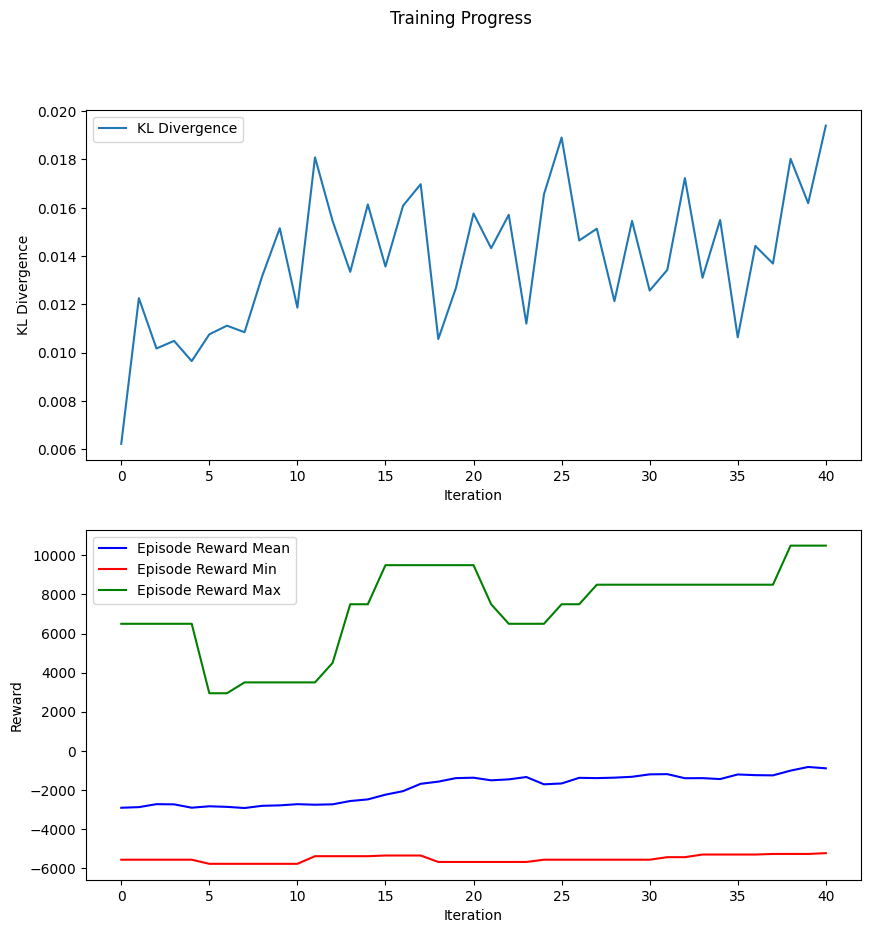

New best model saved with mean reward: -763.25 at TrainingResult(checkpoint=Checkpoint(filesystem=local, path=/content/drive/MyDrive/checkpoints/models/h2currentbest2-part2), metrics={'custom_metrics': {}, 'episode_media': {}, 'info': {'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'grad_gnorm': 0.4482085252956798, 'cur_kl_coeff': 0.20000000000000004, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 9.859112910429637, 'policy_loss': -0.027511537005193532, 'vf_loss': 9.883645415306091, 'vf_explained_var': 0.0005232412368059158, 'kl': 0.014894960134116531, 'entropy': 1.061656745399038, 'entropy_coeff': 0.0}, 'model': {}, 'custom_metrics': {}, 'num_agent_steps_trained': 128.0, 'num_grad_updates_lifetime': 19920.5, 'diff_num_grad_updates_vs_sampler_policy': 239.5}}, 'num_env_steps_sampled': 86016, 'num_env_steps_trained': 86016, 'num_agent_steps_sampled': 86016, 'num_agent_steps_trained': 86016}, 'env_runners': {'episode_reward_max': 10500.0, 'episode_reward_min'

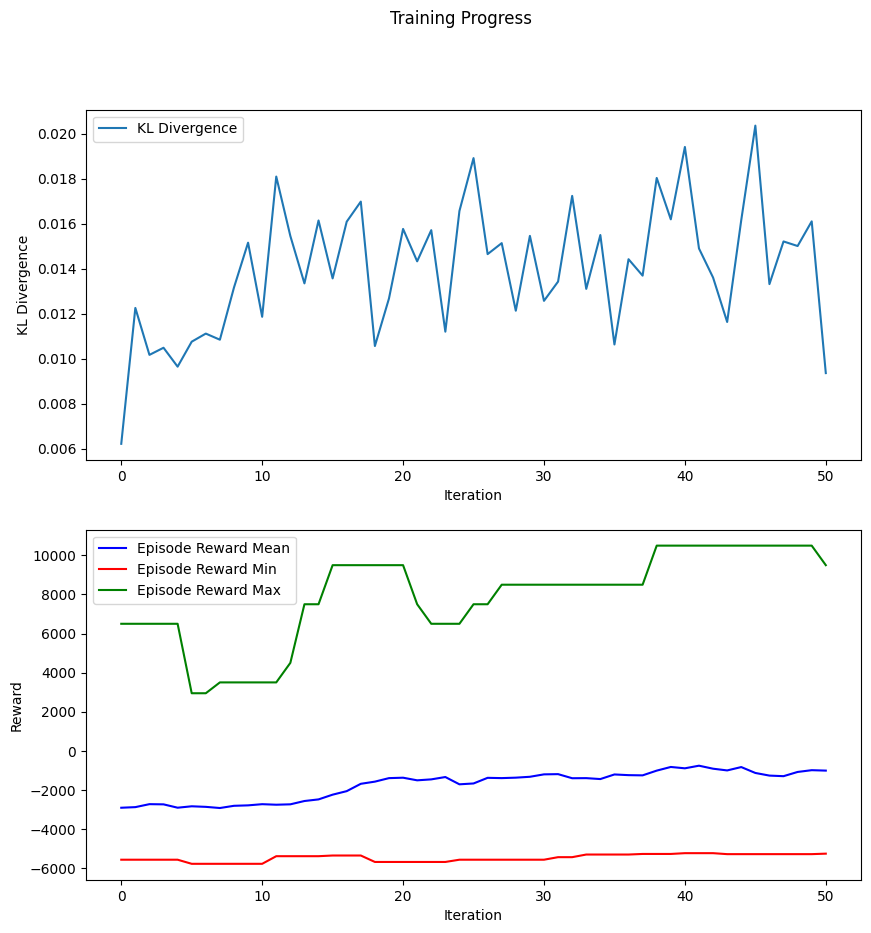

New best model saved with mean reward: -716.80 at TrainingResult(checkpoint=Checkpoint(filesystem=local, path=/content/drive/MyDrive/checkpoints/models/h2currentbest2-part2), metrics={'custom_metrics': {}, 'episode_media': {}, 'info': {'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'grad_gnorm': 0.41268494304579995, 'cur_kl_coeff': 0.29999999999999993, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 9.881645494699479, 'policy_loss': -0.026029055239147662, 'vf_loss': 9.90321918129921, 'vf_explained_var': 0.0006150490293900172, 'kl': 0.014851491781779526, 'entropy': 1.1154448308050633, 'entropy_coeff': 0.0}, 'model': {}, 'custom_metrics': {}, 'num_agent_steps_trained': 128.0, 'num_grad_updates_lifetime': 24720.5, 'diff_num_grad_updates_vs_sampler_policy': 239.5}}, 'num_env_steps_sampled': 106496, 'num_env_steps_trained': 106496, 'num_agent_steps_sampled': 106496, 'num_agent_steps_trained': 106496}, 'env_runners': {'episode_reward_max': 9500.0, 'episode_reward_

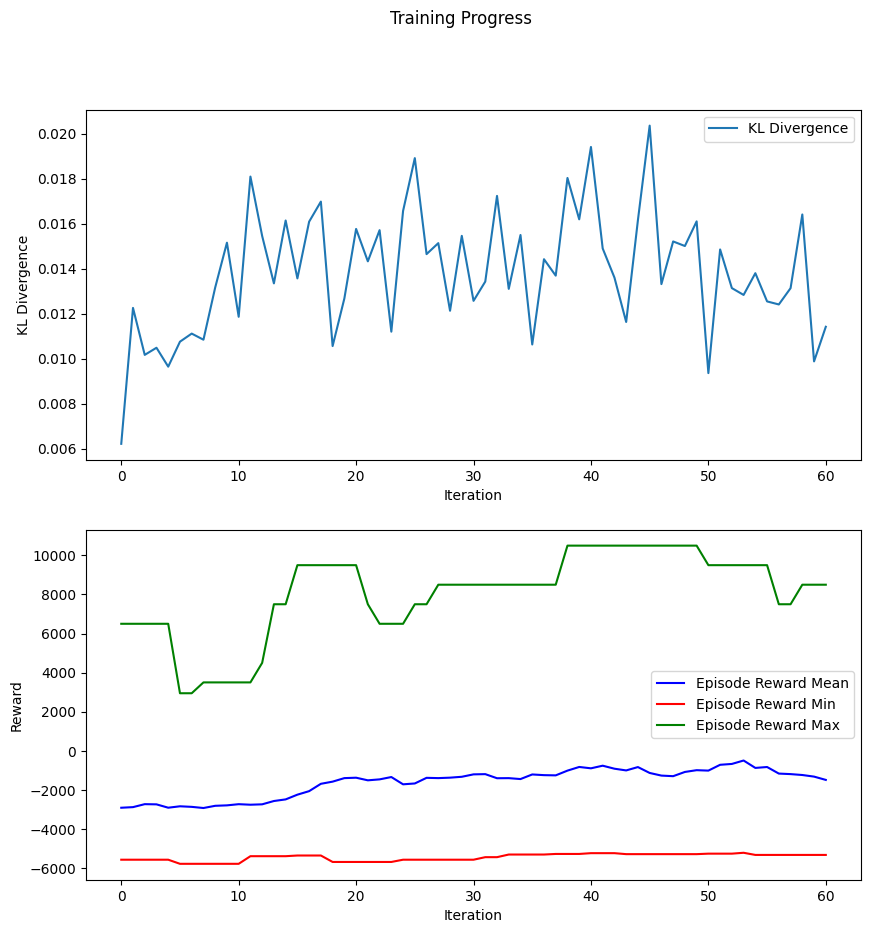

Checkpoint saved at iteration 70


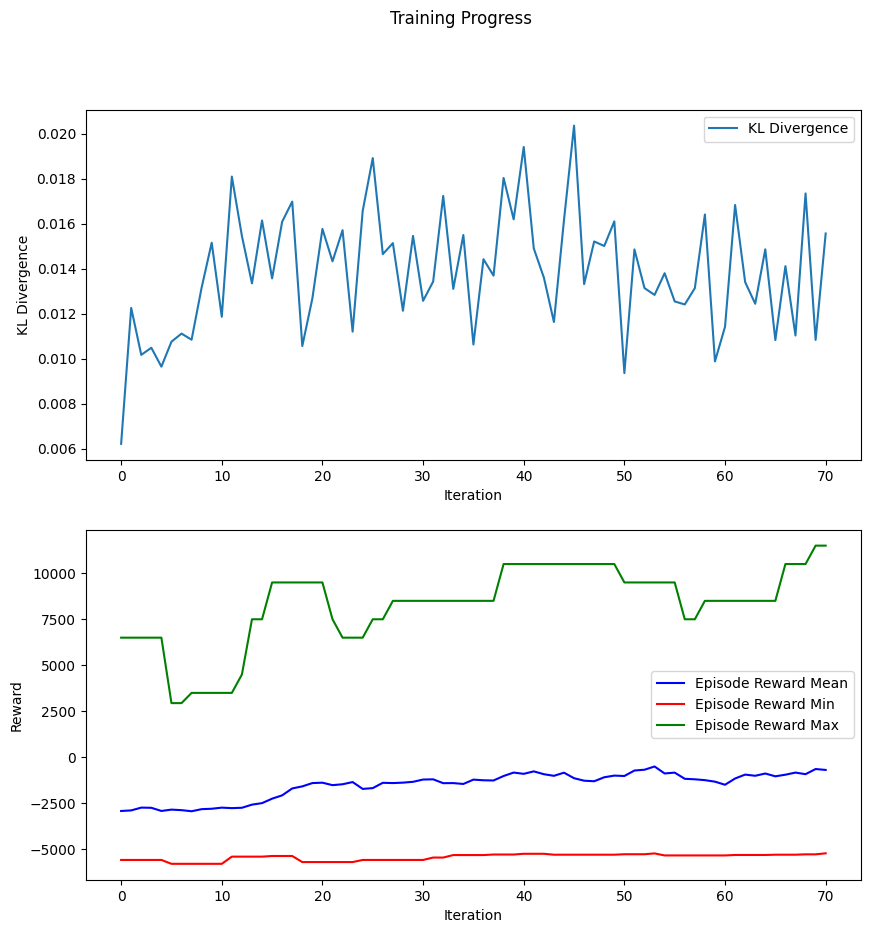

New best model saved with mean reward: -490.50 at TrainingResult(checkpoint=Checkpoint(filesystem=local, path=/content/drive/MyDrive/checkpoints/models/h2currentbest2-part2), metrics={'custom_metrics': {}, 'episode_media': {}, 'info': {'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'grad_gnorm': 0.5054798668716103, 'cur_kl_coeff': 0.29999999999999993, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 9.873172909021378, 'policy_loss': -0.029757638324129705, 'vf_loss': 9.898489727576573, 'vf_explained_var': -0.0003482344249884287, 'kl': 0.01480265693410816, 'entropy': 1.0182964760810136, 'entropy_coeff': 0.0}, 'model': {}, 'custom_metrics': {}, 'num_agent_steps_trained': 128.0, 'num_grad_updates_lifetime': 36720.5, 'diff_num_grad_updates_vs_sampler_policy': 239.5}}, 'num_env_steps_sampled': 157696, 'num_env_steps_trained': 157696, 'num_agent_steps_sampled': 157696, 'num_agent_steps_trained': 157696}, 'env_runners': {'episode_reward_max': 11500.0, 'episode_reward

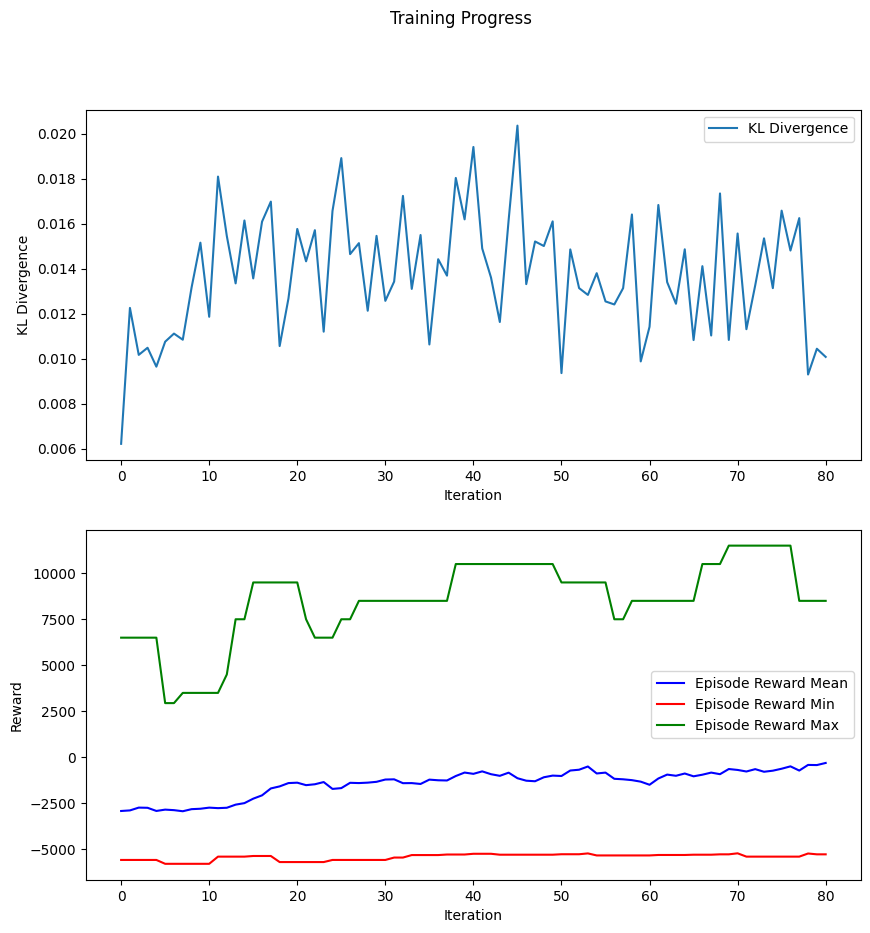

New best model saved with mean reward: -257.40 at TrainingResult(checkpoint=Checkpoint(filesystem=local, path=/content/drive/MyDrive/checkpoints/models/h2currentbest2-part2), metrics={'custom_metrics': {}, 'episode_media': {}, 'info': {'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'grad_gnorm': 0.4836716902597497, 'cur_kl_coeff': 0.29999999999999993, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 9.873219817876816, 'policy_loss': -0.023276505885102477, 'vf_loss': 9.893161553144456, 'vf_explained_var': -0.0015836747984091441, 'kl': 0.011115959878194682, 'entropy': 0.9601527376721303, 'entropy_coeff': 0.0}, 'model': {}, 'custom_metrics': {}, 'num_agent_steps_trained': 128.0, 'num_grad_updates_lifetime': 39120.5, 'diff_num_grad_updates_vs_sampler_policy': 239.5}}, 'num_env_steps_sampled': 167936, 'num_env_steps_trained': 167936, 'num_agent_steps_sampled': 167936, 'num_agent_steps_trained': 167936}, 'env_runners': {'episode_reward_max': 8500.0, 'episode_reward

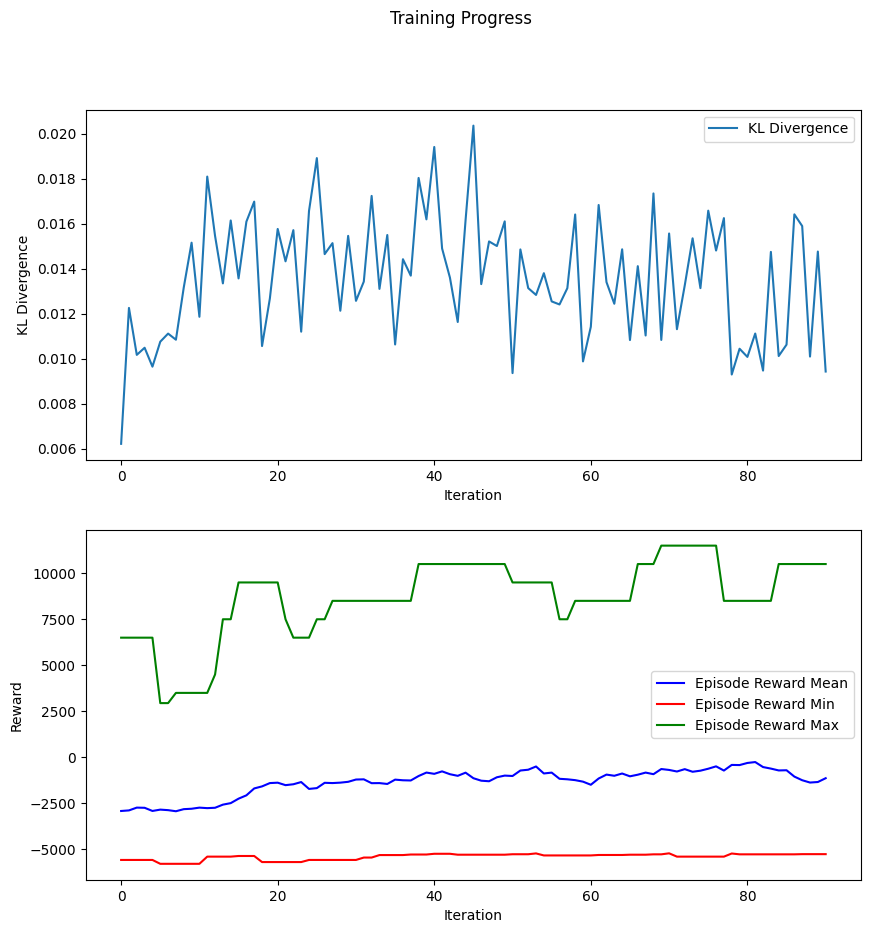

Checkpoint saved at iteration 100


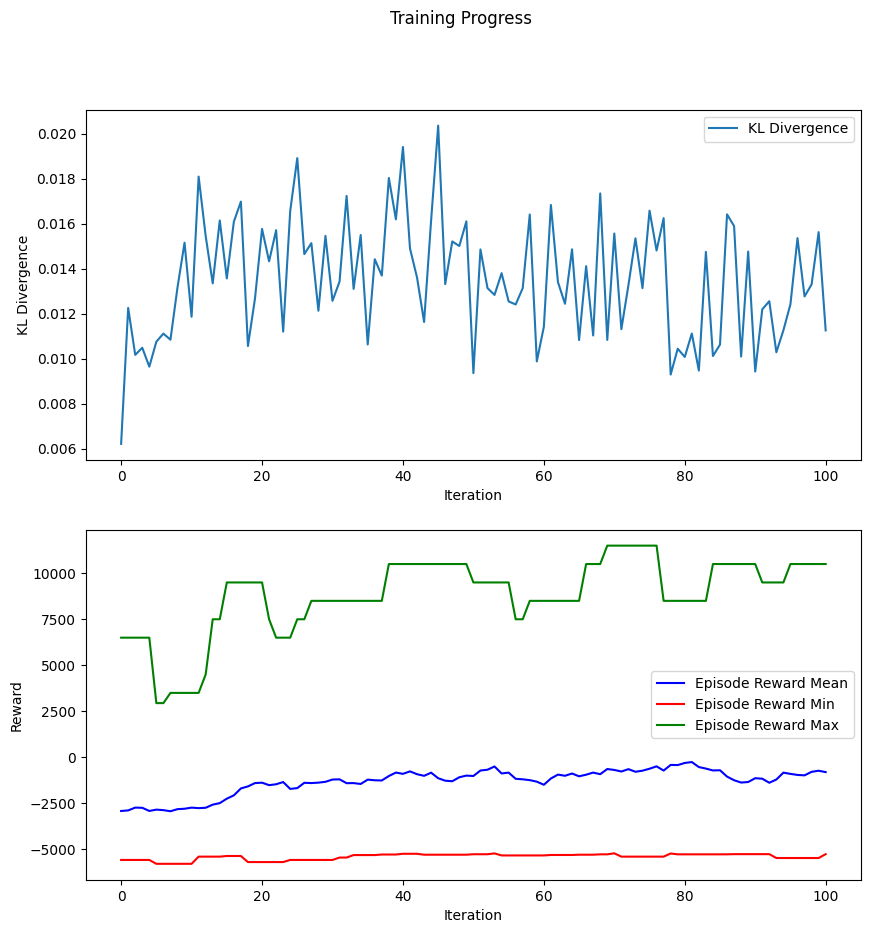

Checkpoint saved at iteration 110


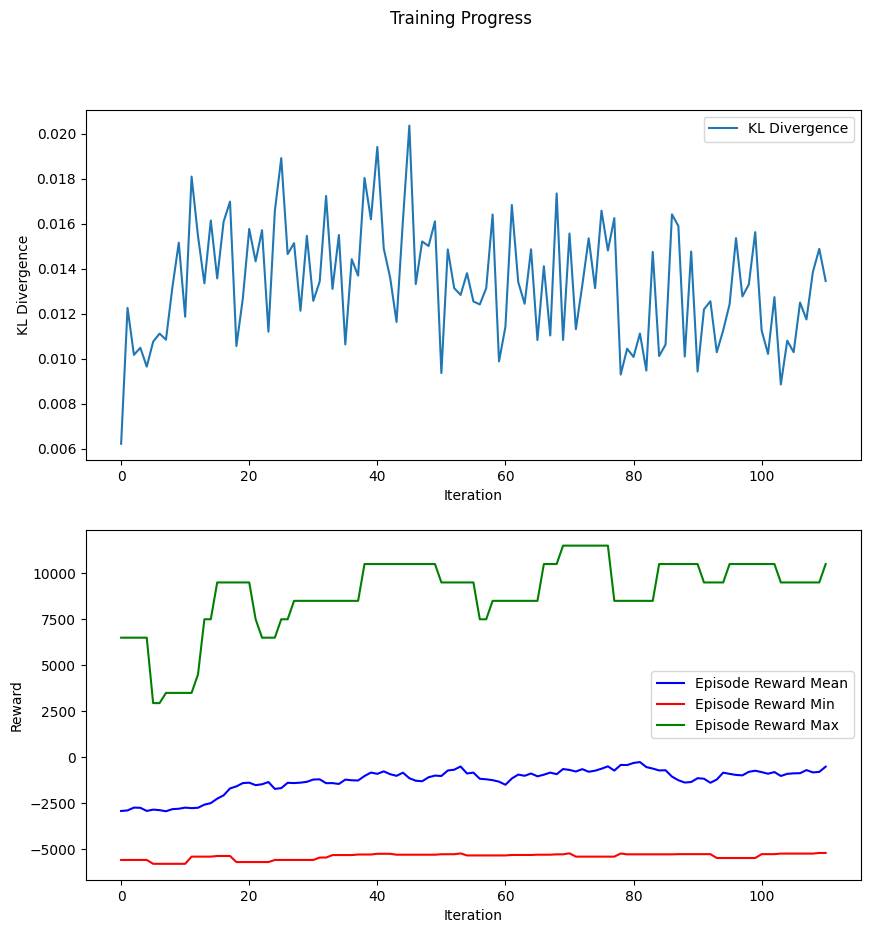

New best model saved with mean reward: -214.85 at TrainingResult(checkpoint=Checkpoint(filesystem=local, path=/content/drive/MyDrive/checkpoints/models/h2currentbest2-part2), metrics={'custom_metrics': {}, 'episode_media': {}, 'info': {'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'grad_gnorm': 0.509259129424269, 'cur_kl_coeff': 0.29999999999999993, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 9.88639196952184, 'policy_loss': -0.022375705682983003, 'vf_loss': 9.905508877833684, 'vf_explained_var': 0.00032191090285778047, 'kl': 0.010862427375515675, 'entropy': 1.064834510286649, 'entropy_coeff': 0.0}, 'model': {}, 'custom_metrics': {}, 'num_agent_steps_trained': 128.0, 'num_grad_updates_lifetime': 54000.5, 'diff_num_grad_updates_vs_sampler_policy': 239.5}}, 'num_env_steps_sampled': 231424, 'num_env_steps_trained': 231424, 'num_agent_steps_sampled': 231424, 'num_agent_steps_trained': 231424}, 'env_runners': {'episode_reward_max': 10500.0, 'episode_reward_m

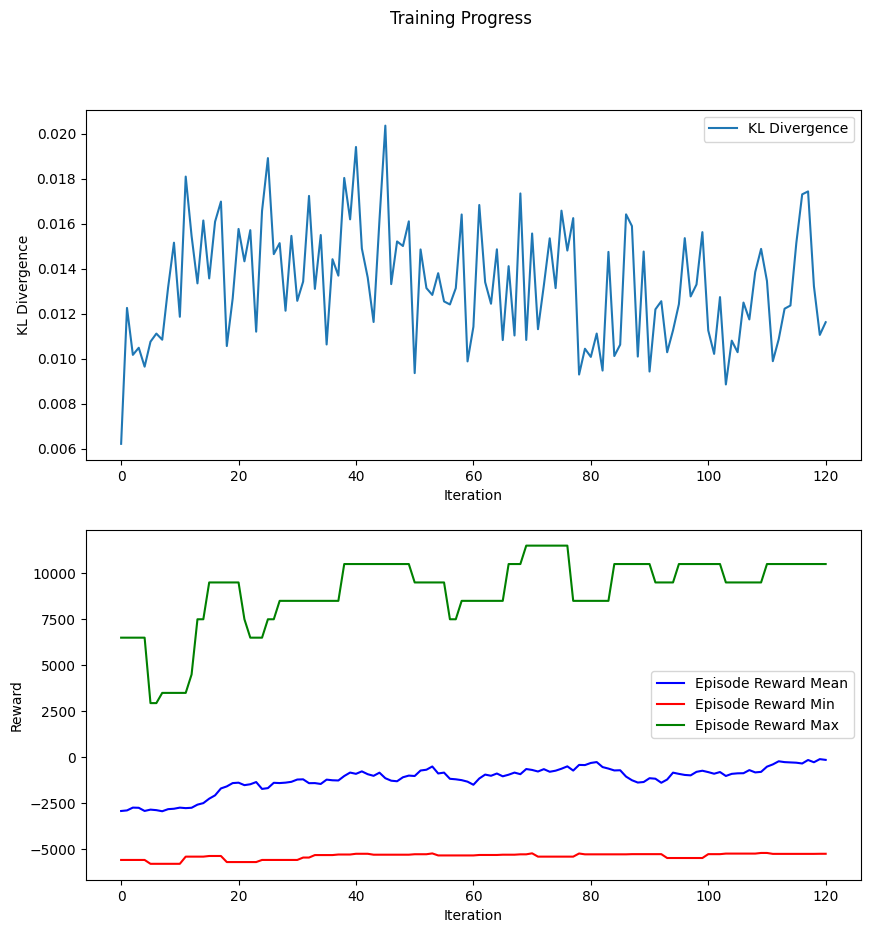

New best model saved with mean reward: 52.95 at TrainingResult(checkpoint=Checkpoint(filesystem=local, path=/content/drive/MyDrive/checkpoints/models/h2currentbest2-part2), metrics={'custom_metrics': {}, 'episode_media': {}, 'info': {'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'grad_gnorm': 0.7042450514777253, 'cur_kl_coeff': 0.29999999999999993, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 9.87866503794988, 'policy_loss': -0.02683771471492946, 'vf_loss': 9.901834887266158, 'vf_explained_var': -0.00030818780263264976, 'kl': 0.012226085249648681, 'entropy': 1.0277880075077215, 'entropy_coeff': 0.0}, 'model': {}, 'custom_metrics': {}, 'num_agent_steps_trained': 128.0, 'num_grad_updates_lifetime': 58800.5, 'diff_num_grad_updates_vs_sampler_policy': 239.5}}, 'num_env_steps_sampled': 251904, 'num_env_steps_trained': 251904, 'num_agent_steps_sampled': 251904, 'num_agent_steps_trained': 251904}, 'env_runners': {'episode_reward_max': 10500.0, 'episode_reward_m

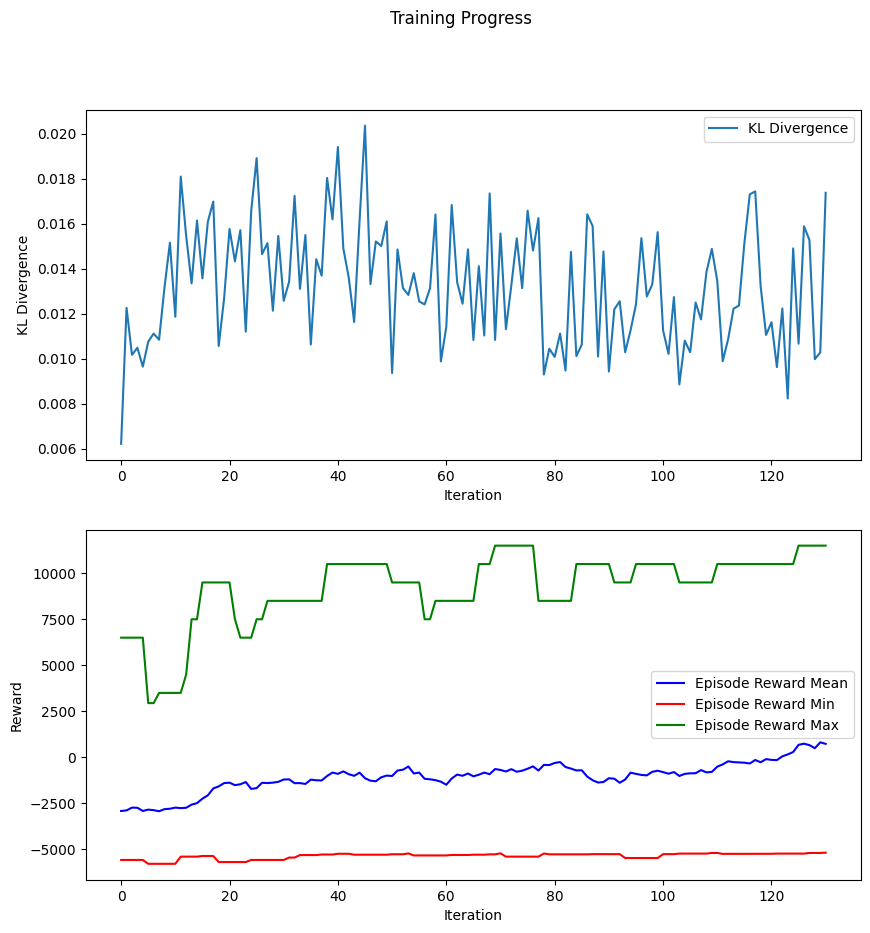

New best model saved with mean reward: 817.70 at TrainingResult(checkpoint=Checkpoint(filesystem=local, path=/content/drive/MyDrive/checkpoints/models/h2currentbest2-part2), metrics={'custom_metrics': {}, 'episode_media': {}, 'info': {'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'grad_gnorm': 0.4217997006994362, 'cur_kl_coeff': 0.29999999999999993, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 9.878715149561565, 'policy_loss': -0.01810105616071572, 'vf_loss': 9.894471325476964, 'vf_explained_var': 0.029291747758785885, 'kl': 0.007816409176789142, 'entropy': 0.8840514607727528, 'entropy_coeff': 0.0}, 'model': {}, 'custom_metrics': {}, 'num_agent_steps_trained': 128.0, 'num_grad_updates_lifetime': 67440.5, 'diff_num_grad_updates_vs_sampler_policy': 239.5}}, 'num_env_steps_sampled': 288768, 'num_env_steps_trained': 288768, 'num_agent_steps_sampled': 288768, 'num_agent_steps_trained': 288768}, 'env_runners': {'episode_reward_max': 8500.0, 'episode_reward_min

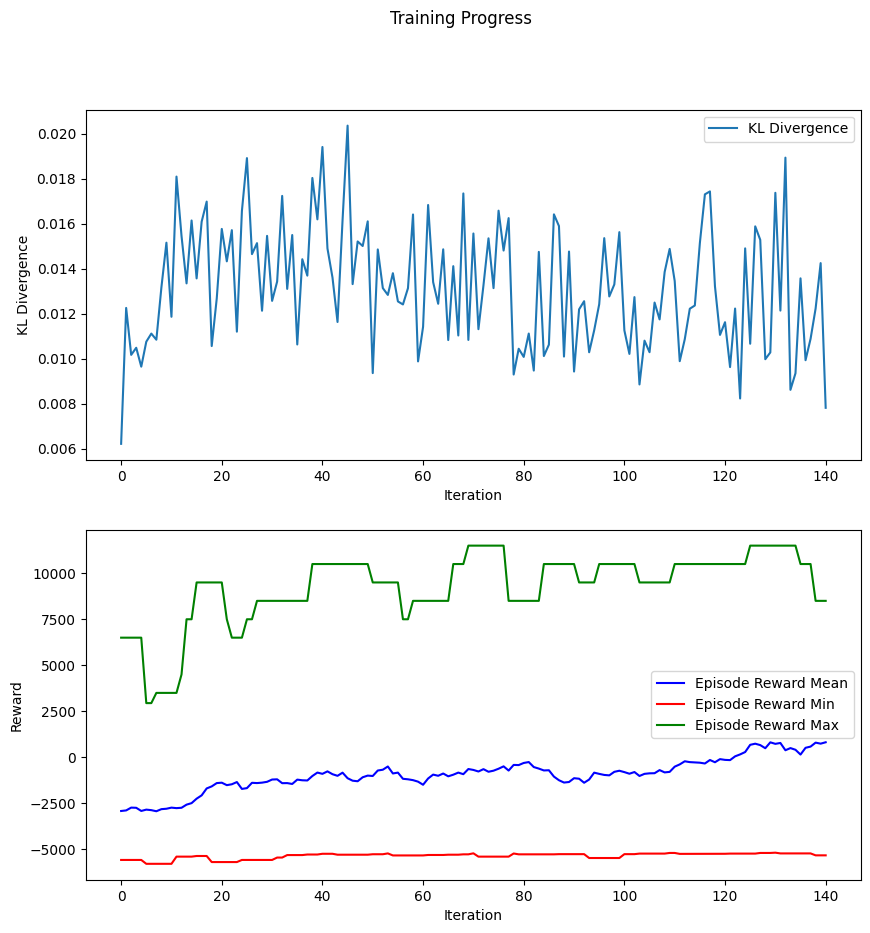

New best model saved with mean reward: 833.25 at TrainingResult(checkpoint=Checkpoint(filesystem=local, path=/content/drive/MyDrive/checkpoints/models/h2currentbest2-part2), metrics={'custom_metrics': {}, 'episode_media': {}, 'info': {'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'grad_gnorm': 0.4443794870749116, 'cur_kl_coeff': 0.29999999999999993, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 9.882591899236044, 'policy_loss': -0.025774666872651626, 'vf_loss': 9.90485356648763, 'vf_explained_var': 0.0009444003303845723, 'kl': 0.011709984075929469, 'entropy': 0.953186001504461, 'entropy_coeff': 0.0}, 'model': {}, 'custom_metrics': {}, 'num_agent_steps_trained': 128.0, 'num_grad_updates_lifetime': 68880.5, 'diff_num_grad_updates_vs_sampler_policy': 239.5}}, 'num_env_steps_sampled': 294912, 'num_env_steps_trained': 294912, 'num_agent_steps_sampled': 294912, 'num_agent_steps_trained': 294912}, 'env_runners': {'episode_reward_max': 8500.0, 'episode_reward_min

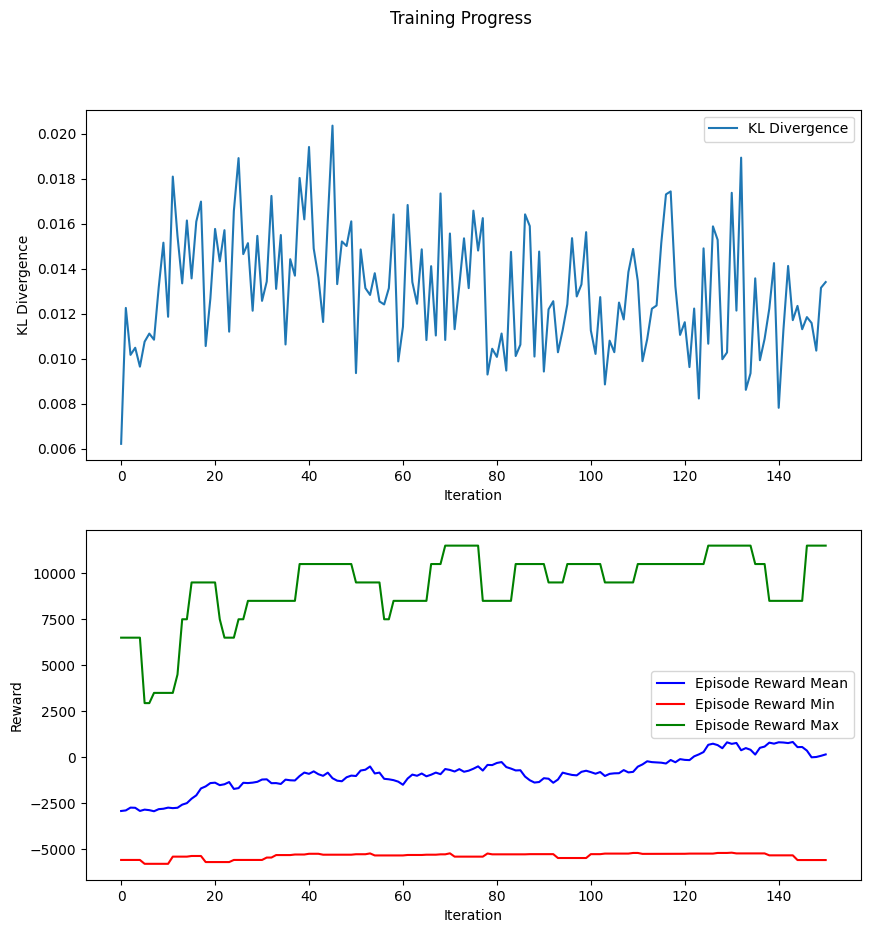

Checkpoint saved at iteration 160


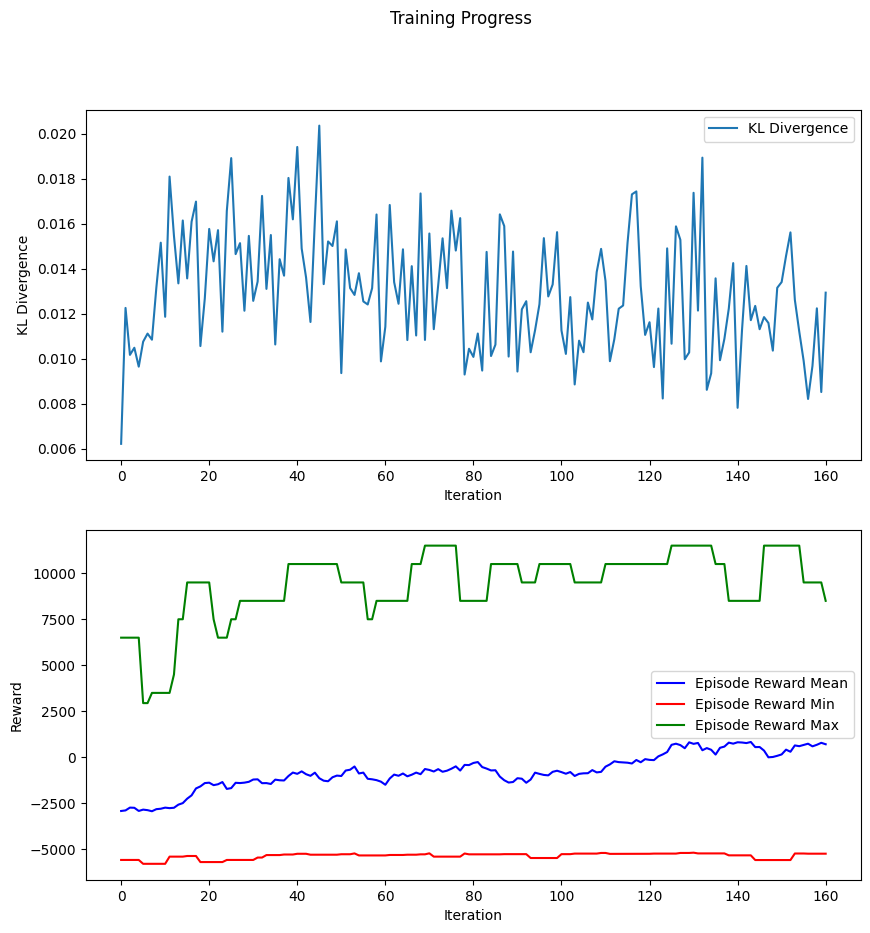

New best model saved with mean reward: 896.35 at TrainingResult(checkpoint=Checkpoint(filesystem=local, path=/content/drive/MyDrive/checkpoints/models/h2currentbest2-part2), metrics={'custom_metrics': {}, 'episode_media': {}, 'info': {'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'grad_gnorm': 0.6676763144011298, 'cur_kl_coeff': 0.29999999999999993, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 9.883260810375214, 'policy_loss': -0.020841562668404853, 'vf_loss': 9.89993595679601, 'vf_explained_var': -0.0008939134577910106, 'kl': 0.01388801750999349, 'entropy': 0.9900373101234436, 'entropy_coeff': 0.0}, 'model': {}, 'custom_metrics': {}, 'num_agent_steps_trained': 128.0, 'num_grad_updates_lifetime': 79440.5, 'diff_num_grad_updates_vs_sampler_policy': 239.5}}, 'num_env_steps_sampled': 339968, 'num_env_steps_trained': 339968, 'num_agent_steps_sampled': 339968, 'num_agent_steps_trained': 339968}, 'env_runners': {'episode_reward_max': 10500.0, 'episode_reward_m

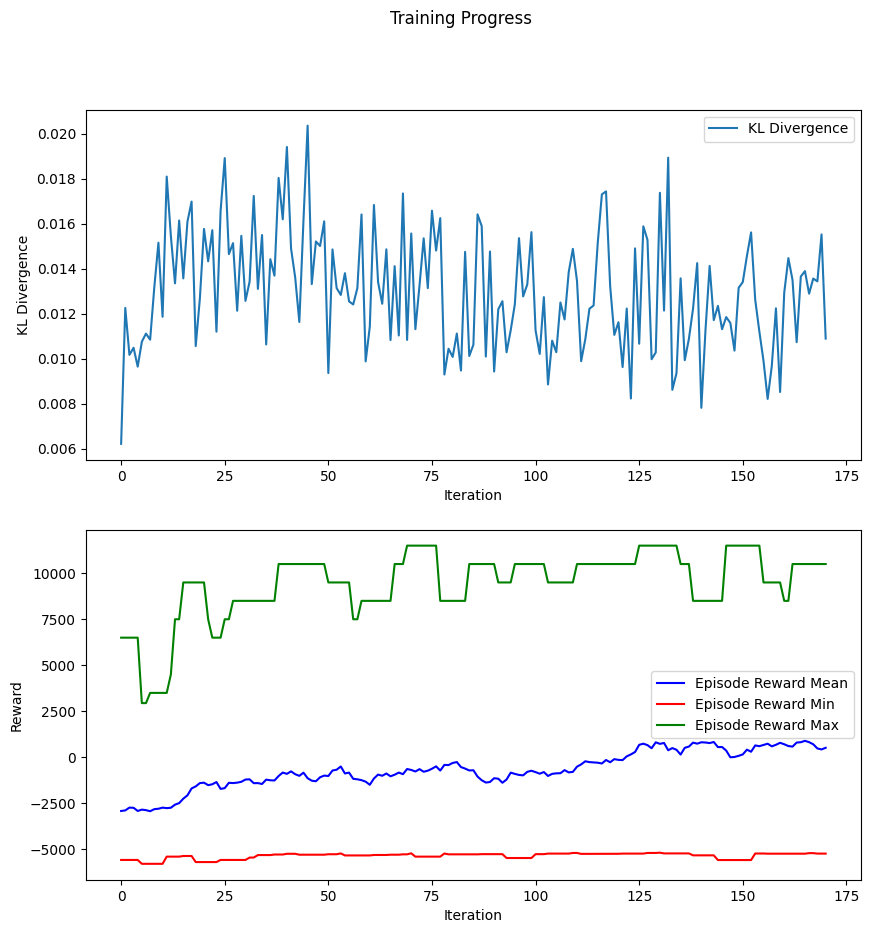

Checkpoint saved at iteration 180


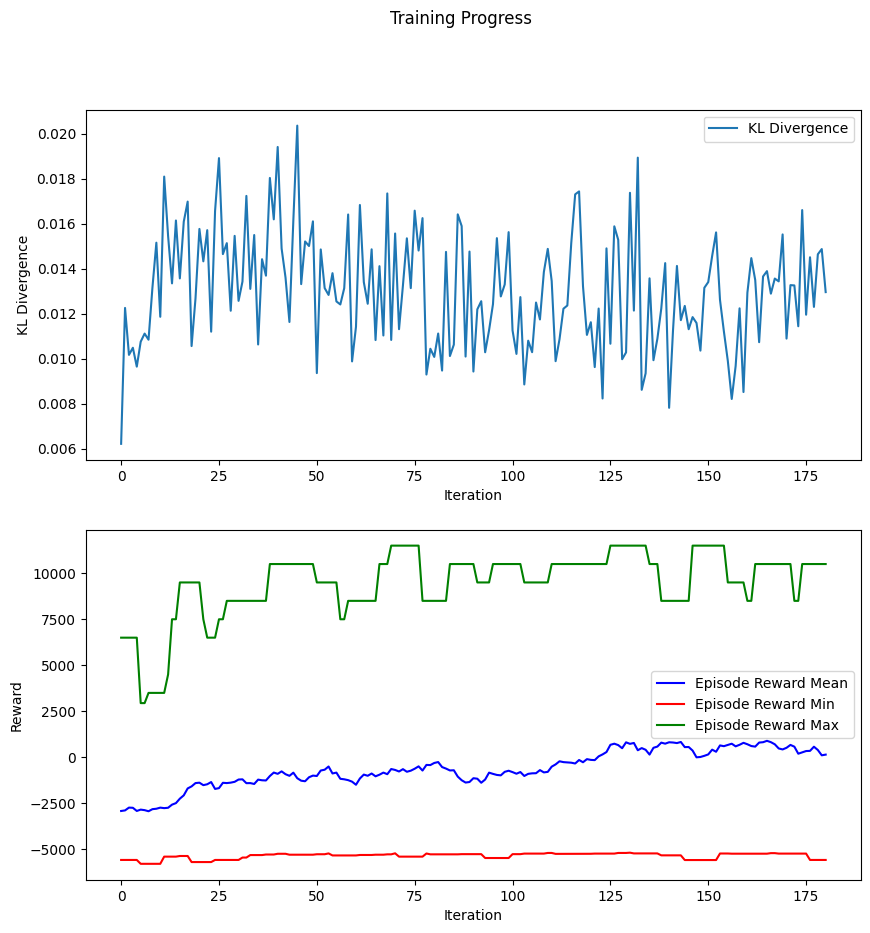

Checkpoint saved at iteration 190


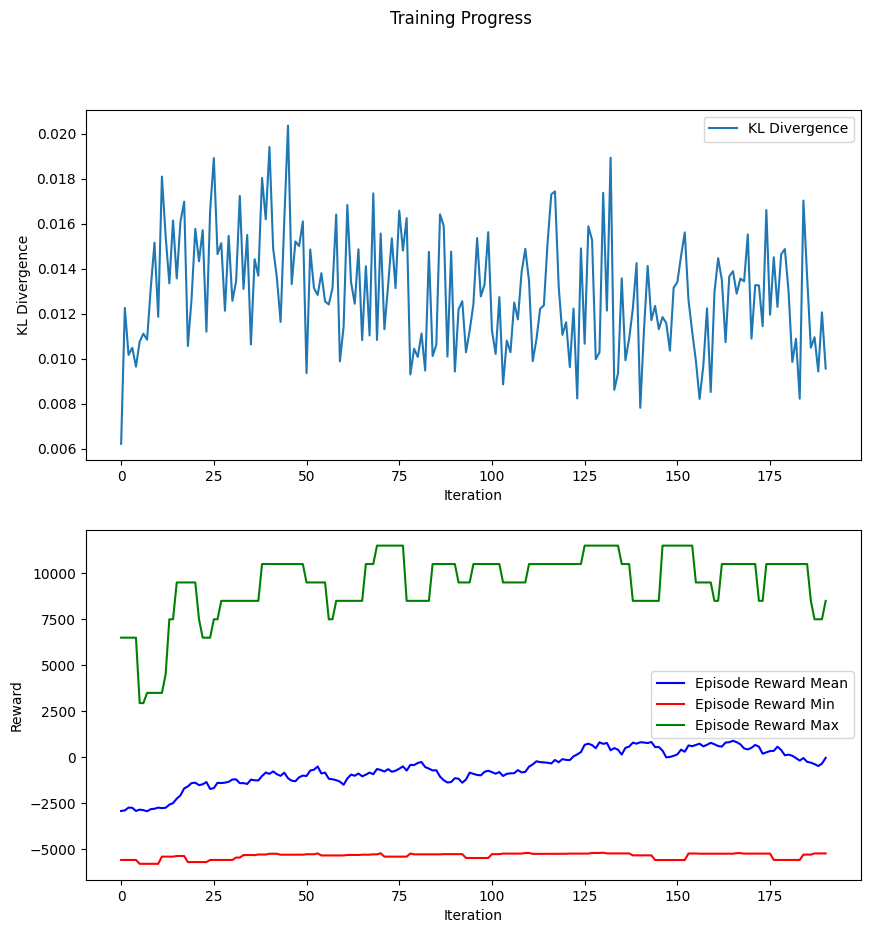

New best model saved with mean reward: 1120.60 at TrainingResult(checkpoint=Checkpoint(filesystem=local, path=/content/drive/MyDrive/checkpoints/models/h2currentbest2-part2), metrics={'custom_metrics': {}, 'episode_media': {}, 'info': {'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'grad_gnorm': 0.4141328159098824, 'cur_kl_coeff': 0.29999999999999993, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 9.870446886618932, 'policy_loss': -0.0233547816829135, 'vf_loss': 9.891266592343648, 'vf_explained_var': -0.0005635148535172145, 'kl': 0.008450219706166941, 'entropy': 0.9152239342530568, 'entropy_coeff': 0.0}, 'model': {}, 'custom_metrics': {}, 'num_agent_steps_trained': 128.0, 'num_grad_updates_lifetime': 94800.5, 'diff_num_grad_updates_vs_sampler_policy': 239.5}}, 'num_env_steps_sampled': 405504, 'num_env_steps_trained': 405504, 'num_agent_steps_sampled': 405504, 'num_agent_steps_trained': 405504}, 'env_runners': {'episode_reward_max': 10500.0, 'episode_reward_

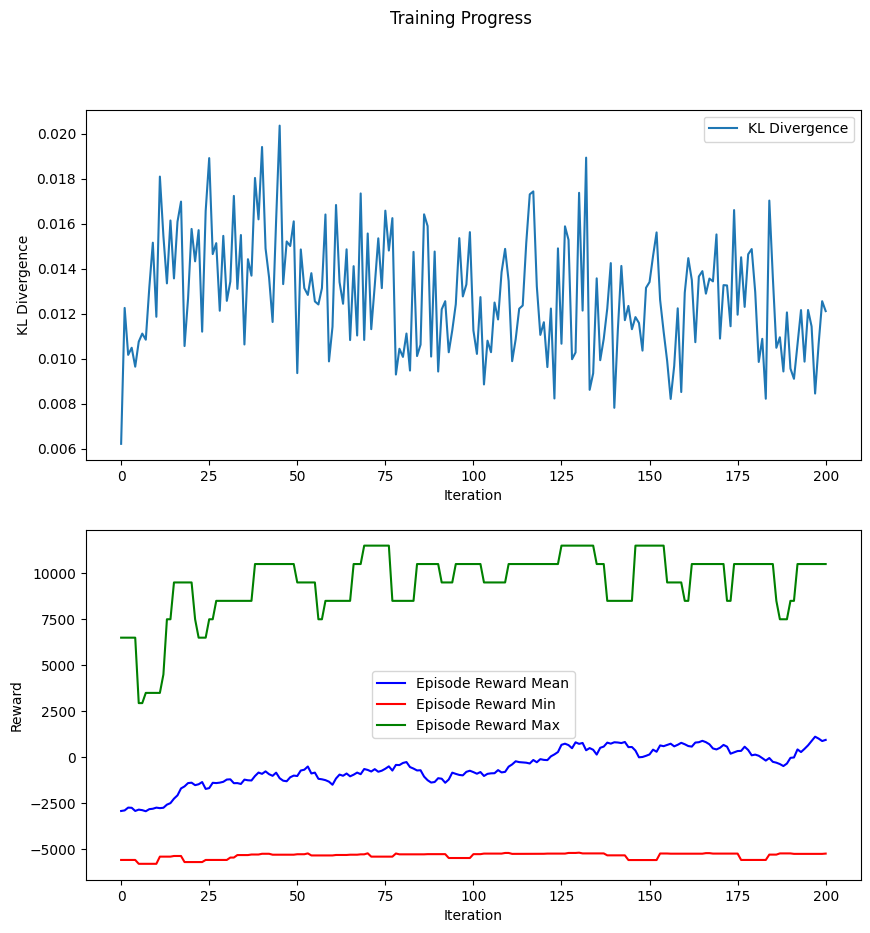

Checkpoint saved at iteration 210


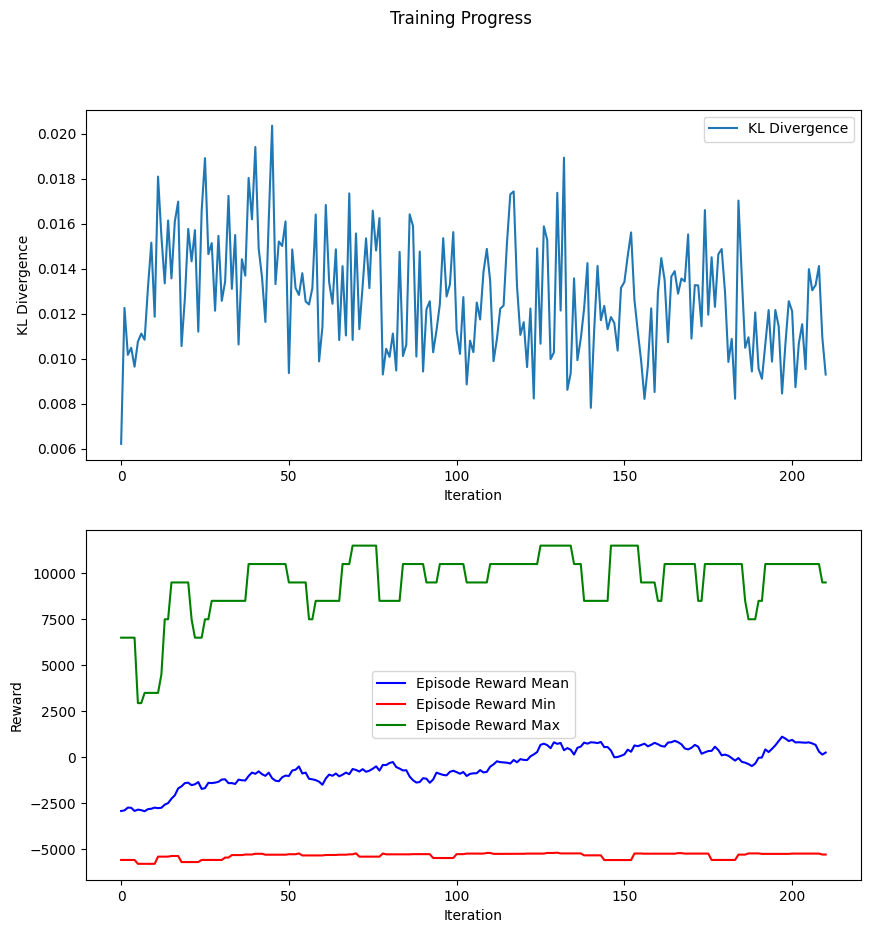

Checkpoint saved at iteration 220


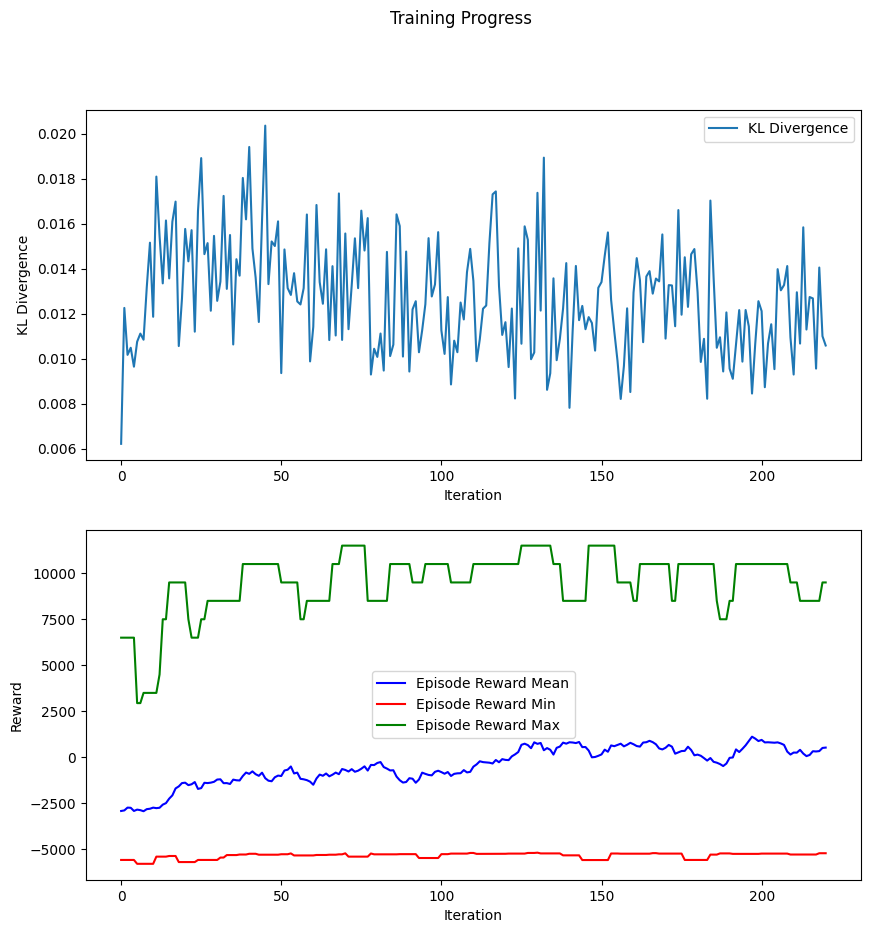

New best model saved with mean reward: 1143.50 at TrainingResult(checkpoint=Checkpoint(filesystem=local, path=/content/drive/MyDrive/checkpoints/models/h2currentbest2-part2), metrics={'custom_metrics': {}, 'episode_media': {}, 'info': {'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'grad_gnorm': 0.6651858213357628, 'cur_kl_coeff': 0.29999999999999993, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 9.86631273229917, 'policy_loss': -0.029621987836435437, 'vf_loss': 9.89216010371844, 'vf_explained_var': 0.004433460533618927, 'kl': 0.012581998868274881, 'entropy': 0.97473107924064, 'entropy_coeff': 0.0}, 'model': {}, 'custom_metrics': {}, 'num_agent_steps_trained': 128.0, 'num_grad_updates_lifetime': 110160.5, 'diff_num_grad_updates_vs_sampler_policy': 239.5}}, 'num_env_steps_sampled': 471040, 'num_env_steps_trained': 471040, 'num_agent_steps_sampled': 471040, 'num_agent_steps_trained': 471040}, 'env_runners': {'episode_reward_max': 11500.0, 'episode_reward_min

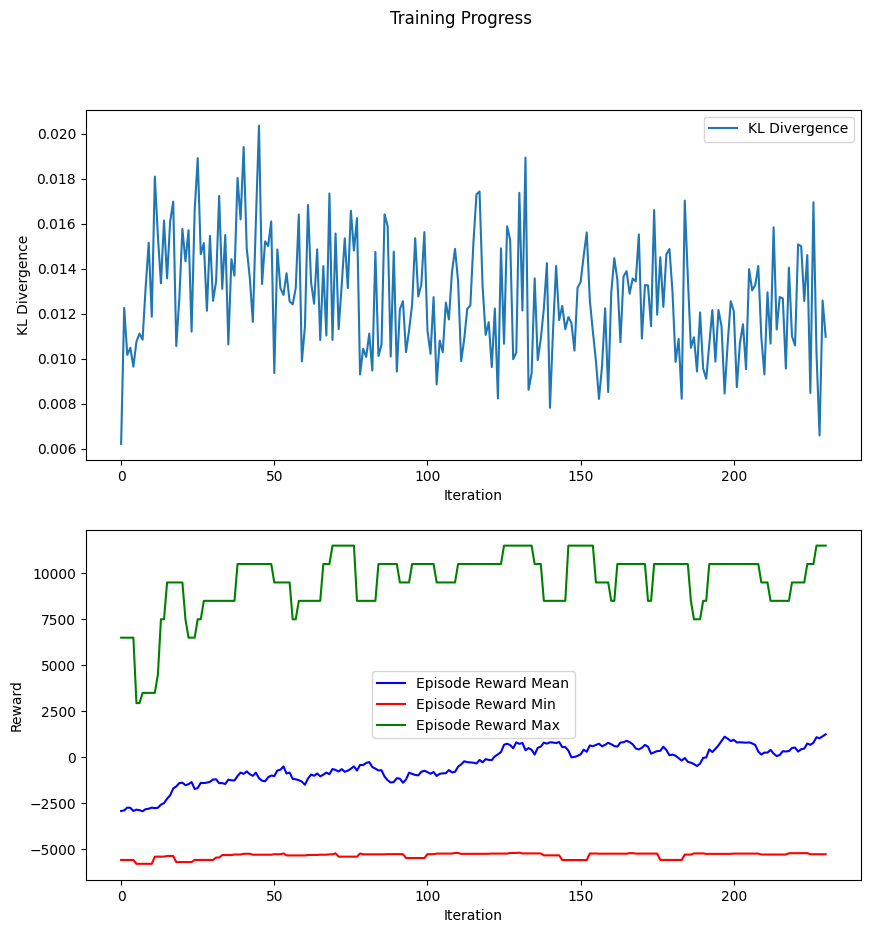

New best model saved with mean reward: 1513.35 at TrainingResult(checkpoint=Checkpoint(filesystem=local, path=/content/drive/MyDrive/checkpoints/models/h2currentbest2-part2), metrics={'custom_metrics': {}, 'episode_media': {}, 'info': {'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'grad_gnorm': 0.6309105511909971, 'cur_kl_coeff': 0.29999999999999993, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 9.857582573095957, 'policy_loss': -0.023895409101775535, 'vf_loss': 9.877773590882619, 'vf_explained_var': -0.0030686845382054645, 'kl': 0.012347788957171901, 'entropy': 0.8655089264114698, 'entropy_coeff': 0.0}, 'model': {}, 'custom_metrics': {}, 'num_agent_steps_trained': 128.0, 'num_grad_updates_lifetime': 111120.5, 'diff_num_grad_updates_vs_sampler_policy': 239.5}}, 'num_env_steps_sampled': 475136, 'num_env_steps_trained': 475136, 'num_agent_steps_sampled': 475136, 'num_agent_steps_trained': 475136}, 'env_runners': {'episode_reward_max': 11500.0, 'episode_rewa

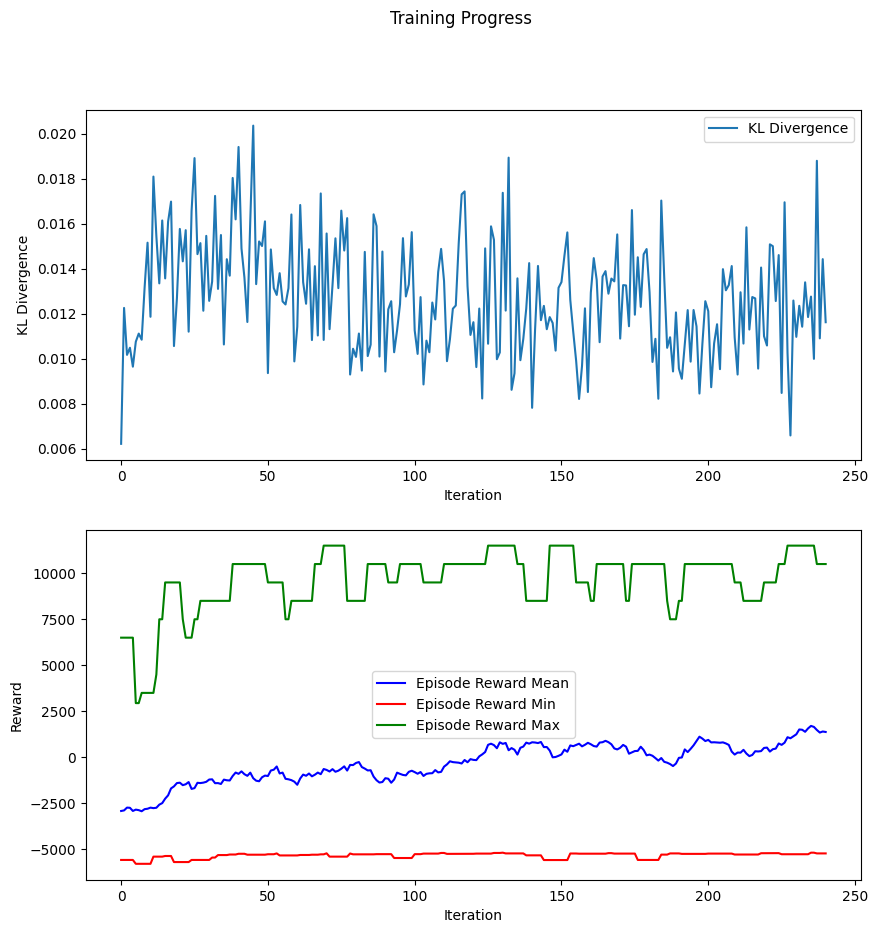

Final checkpoint saved in directory TrainingResult(checkpoint=Checkpoint(filesystem=local, path=/content/drive/MyDrive/checkpoints/models/h2check2-part3), metrics={'custom_metrics': {}, 'episode_media': {}, 'info': {'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'grad_gnorm': 0.5783081201991688, 'cur_kl_coeff': 0.29999999999999993, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 9.86726054350535, 'policy_loss': -0.025794057024177162, 'vf_loss': 9.88927849928538, 'vf_explained_var': 0.0012990324447552362, 'kl': 0.012586968991868019, 'entropy': 0.8749606678883235, 'entropy_coeff': 0.0}, 'model': {}, 'custom_metrics': {}, 'num_agent_steps_trained': 128.0, 'num_grad_updates_lifetime': 119760.5, 'diff_num_grad_updates_vs_sampler_policy': 239.5}}, 'num_env_steps_sampled': 512000, 'num_env_steps_trained': 512000, 'num_agent_steps_sampled': 512000, 'num_agent_steps_trained': 512000}, 'env_runners': {'episode_reward_max': 10500.0, 'episode_reward_min': -5210.0, 'epis

In [ ]:
from ray.rllib.algorithms.ppo import PPOConfig
from ray import tune
import os
import matplotlib.pyplot as plt

num_iterations = 250
batch_size = 256 * 8
lambda_ = 0.9
checkpoint_path = '/content/drive/MyDrive/checkpoints/models/h2check2-part3'
best_checkpoint_dir = '/content/drive/MyDrive/checkpoints/models/h2currentbest2-part2'

tune.register_env("my_env", lambda config: HockeyEnv())

config = PPOConfig().environment(env="my_env").training(
    train_batch_size=batch_size,
    lambda_=lambda_,
)
algo = config.build()

from google.colab import drive
drive.mount('/content/drive')
if os.path.exists('/content/drive/MyDrive/checkpoints/models/h2check3'):
    algo.restore('/content/drive/MyDrive/checkpoints/models/h2check3')

os.makedirs(checkpoint_path, exist_ok=True)
os.makedirs(best_checkpoint_dir, exist_ok=True)

best_mean_reward = float('-inf')
kl_divergence_history = []
reward_mean_history = []
reward_min_history = []
reward_max_history = []

# Training loop
for i in range(num_iterations):
    result = algo.train()

    # Track metrics
    kl_divergence = result.get("info", {}).get("learner", {}).get("default_policy", {}).get("learner_stats", {}).get("kl", None)
    reward_mean = result.get("env_runners", {}).get("episode_reward_mean", None)
    reward_min = result.get("env_runners", {}).get("episode_reward_min", None)
    reward_max = result.get("env_runners", {}).get("episode_reward_max", None)

    if reward_mean and reward_mean > best_mean_reward:
        best_mean_reward = reward_mean
        best_checkpoint_path = algo.save(best_checkpoint_dir)
        print(f"New best model saved with mean reward: {best_mean_reward:.2f} at {best_checkpoint_path}")

    # Append metrics
    if kl_divergence is not None:
        kl_divergence_history.append(kl_divergence)
    if reward_mean is not None:
        reward_mean_history.append(reward_mean)
    if reward_min is not None:
        reward_min_history.append(reward_min)
    if reward_max is not None:
        reward_max_history.append(reward_max)

    # Save progress every 10 iterations
    if i % 10 == 0:
        algo.save(checkpoint_path)
        print(f"Checkpoint saved at iteration {i}")

        # Plot KL divergence and rewards
        if i > 0:
            fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))
            fig.suptitle("Training Progress")

            # KL Divergence Plot
            ax1.plot(kl_divergence_history, label="KL Divergence")
            ax1.set_xlabel("Iteration")
            ax1.set_ylabel("KL Divergence")
            ax1.legend()

            # Reward Plot (mean, min, max)
            ax2.plot(reward_mean_history, label="Episode Reward Mean", color="blue")
            ax2.plot(reward_min_history, label="Episode Reward Min", color="red")
            ax2.plot(reward_max_history, label="Episode Reward Max", color="green")
            ax2.set_xlabel("Iteration")
            ax2.set_ylabel("Reward")
            ax2.legend()
            plt.show()

# Save final checkpoint
final_checkpoint_dir = algo.save(checkpoint_path)
print(f"Final checkpoint saved in directory {final_checkpoint_dir}")


In [ ]:
#SKIP THIS CELL to just use the last iteration of algo from above
### To restore the checkpointed training
#
#from ray import tune
#import gymnasium as gym
#import matplotlib.pyplot as plt
#from IPython.display import Image, display
#import imageio
#import time
#
#
#tune.register_env("my_env", lambda config: HockeyEnv())
#
# Clean up any previous algorithm instance
#if 'algo' in globals():
#    algo.stop()
#    del algo
#
#checkpoint_path = '/content/drive/MyDrive/checkpoints/models/h2check2'
#restore_me = checkpoint_path# '/content/drive/MyDrive/checkpoints/models/check3'
#from ray.rllib.algorithms.ppo import PPOConfig
#config = PPOConfig().environment(env="my_env")#.training(train_batch_size=512)
#config.model.update(model_config)
# config.resources(num_gpus=.05)
# Build.
#algo = config.build()
#algo.restore(restore_me)

Exception ignored in: <function GLContext.__del__ at 0x7ddfe8bbf130>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/mujoco/glfw/__init__.py", line 41, in __del__
    self.free()
  File "/usr/local/lib/python3.10/dist-packages/mujoco/glfw/__init__.py", line 34, in free
    if self._context:
AttributeError: 'GLContext' object has no attribute '_context'


Saved trial-0.gif


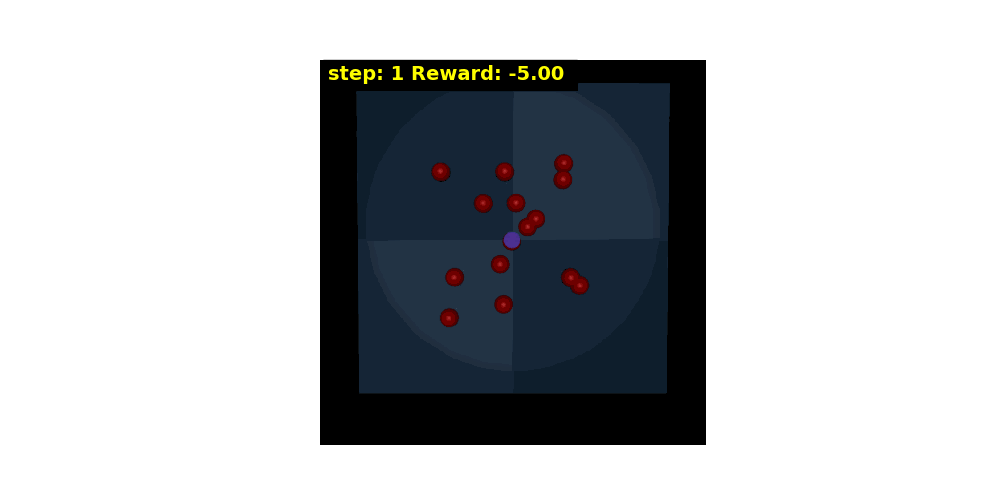

Saved trial-1.gif


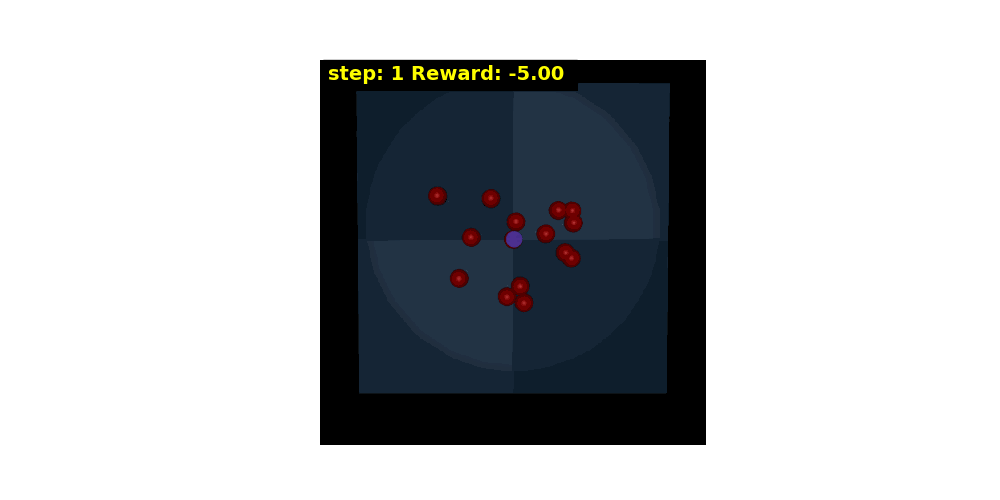

Saved trial-2.gif


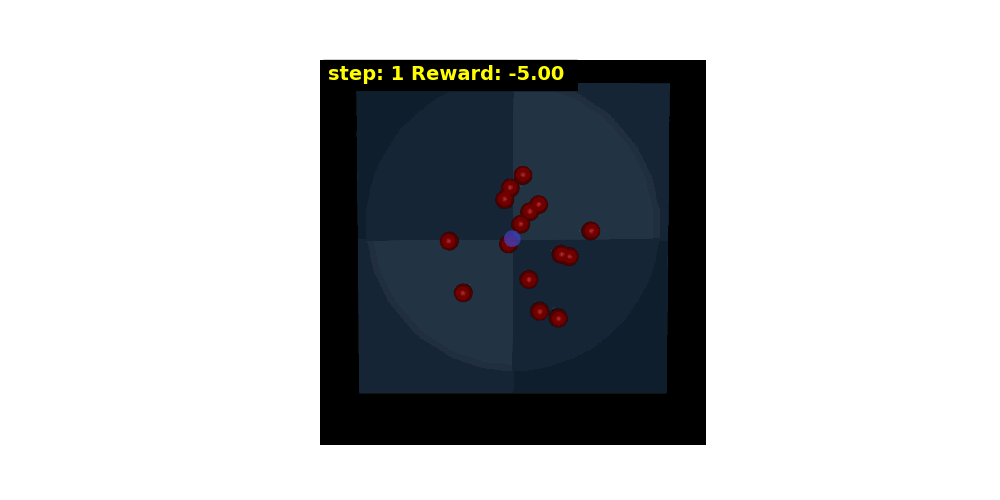

Saved trial-3.gif


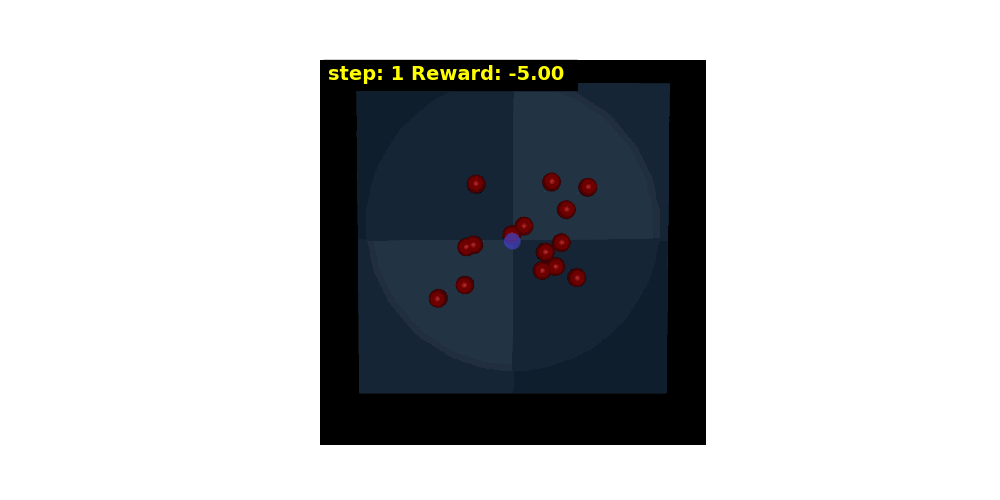

(raylet) [2024-12-03 07:37:13,272 E 2950 2950] (raylet) node_manager.cc:3069: 1 Workers (tasks / actors) killed due to memory pressure (OOM), 0 Workers crashed due to other reasons at node (ID: cd65cb9df3faf6a338584911fc290d018f268ad388e87c2f39dd240f, IP: 172.28.0.12) over the last time period. To see more information about the Workers killed on this node, use `ray logs raylet.out -ip 172.28.0.12`
(raylet) 
(raylet) Refer to the documentation on how to address the out of memory issue: https://docs.ray.io/en/latest/ray-core/scheduling/ray-oom-prevention.html. Consider provisioning more memory on this node or reducing task parallelism by requesting more CPUs per task. To adjust the kill threshold, set the environment variable `RAY_memory_usage_threshold` when starting Ray. To disable worker killing, set the environment variable `RAY_memory_monitor_refresh_ms` to zero.
(raylet) 
(raylet) [2024-12-03 07:38:13,510 E 2950 2950] (raylet) node_manager.cc:3069: 1 Workers (tasks / actors) killed

In [ ]:
## Tests the policy in algo

example_runs = 10
prepend_to_gif_file = "trial-"


#Testing "algo" and demonstrating its use with GIFs
policy = algo.get_policy()

import matplotlib.pyplot as plt
from IPython.display import Image, display
import imageio

env = HockeyEnv(render_mode="rgb_array",camera_name="topdown")


def add_text_to_frame(frame, text, x, y):
    # Convert the frame to a Matplotlib figure with the text overlay
    fig, ax = plt.subplots()
    ax.imshow(frame)
    ax.axis('off')  # Hide axes
    ax.text(x, y, text, color="yellow", fontsize=14, fontweight='bold', backgroundcolor='black')
    fig.canvas.draw()
    # Convert the Matplotlib figure back to an image array
    frame_with_text = np.frombuffer(fig.canvas.buffer_rgba(), dtype=np.uint8)
    frame_with_text = frame_with_text.reshape(fig.canvas.get_width_height()[::-1] + (4,))  # RGBA channels
    plt.close(fig)  # Close the figure to save memory
    return frame_with_text

def render_policy_episode(env, extra_frames=200):
    env.reset()
    steps = 0
    step_counter = 0
    keep_rendering = True
    obs, info = env.reset()
    frames = []
    total_reward = 0
    while keep_rendering:
        steps += 1
        action = policy.compute_single_action(obs)[0]
        obs, reward, terminated, truncated, ddd = env.step(action)
        total_reward += reward
        frame = env.render()  # Assuming "rgb_array" mode
        frame_with_text = add_text_to_frame(frame, "step: "+str(steps)+ f" Reward: {total_reward:.2f} ", 10, 25)
        frames.append(frame_with_text)
        # Check for done or truncated flags and start counting extra frames
        if terminated or truncated:
            step_counter += 1
            if step_counter >= extra_frames:
                keep_rendering = False
                break
        else:
            step_counter = 0  # Reset the counter if not done/truncated
    return frames

for i in range(example_runs):
    frames = render_policy_episode(env,300)
    savefilename = prepend_to_gif_file+str(i)+'.gif'
    imageio.mimsave(savefilename, frames, fps=20, loop=0)#0 goes forever
    print("Saved "+savefilename)
    display(Image(filename=savefilename))

# **Reflections:**

## **Summary of RL Training and Changes**

### **Note**:
Agent was trained for **250 iterations**, which took approximately **1 hour** to train each run.

### **Environment Setup**:
- Player starts at the center of the field and is surrounded by 15 pucks.
- The observation space tracks the player’s position, velocity, and the positions/velocities of all of the pucks.
- The action space uses discrete actions mapped to directional forces.

### **Reward System**:
- **+1000**: Reward for each puck knocked off the field.
- **-5**: Penalty for unnecessary movements.
- **-5000**: Penalty for going out of bounds.

### **Training Details**:
- The agent was trained using **250 iterations**.
- Mean, min, max, and KL divergence were logged and visualized for monitoring the learning progress.

**SEE**: SLIDE 7 in “project 3 - group 3” PowerPoint attachment.

- Checkpoints were saved periodically to preserve progress and allow re-training or evaluation of earlier models (also if it timed out or Wi-Fi cut out).

### **Evaluation Process**:
- After training, the agent’s behavior was evaluated by replaying its actions using the trained policy and GIFs were created to visualize the agent’s performance.

**SEE**: SLIDE 7 in “project 3 - group 3” PowerPoint attachment.

### **Key Observations**:
- The agent started with random movements, hitting some pucks but gradually learned to focus on the nearest puck in bounds and move towards it.

**SEE**: SLIDES 2 & 3 in “project 3 - group 3” PowerPoint attachment.

- By the end of training, it was able to clear multiple pucks in succession while staying within bounds for the most part. It will correct itself to get the pucks that have not been cleared.

**SEE**: SLIDE 4 in “project 3 - group 3” PowerPoint attachment.

---

## **Reflection on Successes and Novel Behavior**

### **Early Training**:
At the start, the player moved randomly and often didn’t interact with the pucks. Some pucks moved on their own at the beginning of trials, which inflated rewards without the player actually doing anything. The player also went out of bounds frequently, leading to large penalties.

**SEE**: SLIDE 2 in “project 3 - group 3” PowerPoint attachment.

### **Mid Training**:
Around **100 iterations**, the player started targeting nearby pucks but often overshot the testing area, earning penalties. Movements were inefficient, with unnecessary backtracking after pushing pucks.

**SEE**: SLIDE 3 in “project 3 - group 3” PowerPoint attachment.

### **Late Training**:
By the end of **250 iterations**, the player showed a clear strategy: pushing the nearest puck off the field before moving to the next. Overshooting became rare, and movements were smoother. However, some pucks still moved without contact early in the trials.

**SEE**: SLIDES 4 & 6 in “project 3 - group 3” PowerPoint attachment.

### **Failures and Challenges**:
- Early random behavior made learning slow.
- Pucks moving on their own at the start gave unearned rewards.
- Overshooting the field delayed progress and caused penalties.

**SEE**: SLIDE 5 in “project 3 - group 3” PowerPoint attachment.

---

## **Reflection on Key Changes**

### **Most Impactful Changes**
1. **Reward Adjustments**:
   - Adding a penalty for idle movement encouraged the player to stay active and explore the field.
   - A large penalty for going out of bounds (-5000) also reduced wasted effort and kept the player within the field.

2. **Simplified Observation Space**:
   - Instead of tracking all puck positions and velocities, focusing on the nearest puck made learning faster.

3. **Batch Size and Iterations**:
   - Using a larger batch size (256×8) helped stabilize training, even with only 250 iterations.

### **What We Would Do Differently**:
1. **Fix Environmental Issues**:
   - Address the issue where some pucks move at the start of the trial without being touched, as it skews rewards and evaluation.

2. **Explore Continuous Action Space**:
   - Switching to continuous actions could allow for smoother and more precise movements, potentially leading to faster learning.

3. **Extend Training**:
   - Run for more than 250 iterations if computational resources allow and time permits.

---

## **Most Successful Example**

### **Training Conditions That Led to Success**:
Same as reflection question 1.

**SEE**: SLIDES 6 & 7 in “project 3 - group 3” PowerPoint attachment.

